In [166]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import tensorflow as tf
import matplotlib.pyplot as plt
import sklearn.preprocessing
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from keras.layers import Dense,Dropout,LSTM, GRU, SimpleRNN
from keras.layers import TimeDistributed
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers import ConvLSTM2D
from keras.layers.convolutional import MaxPooling1D
from keras.models import Sequential
from keras.losses import mean_squared_error
from keras.backend import sign
import math

# Data Processing

In [98]:
df = pd.read_csv('weatherHistory.csv')
df.head()

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [99]:
df = df[['Humidity']]
df.describe()

,Humidity
count,96453.000000
mean,0.734899
std,0.195473
min,0.000000
25%,0.600000
50%,0.780000
75%,0.890000
max,1.000000


In [100]:
data = df.to_numpy()
data.shape

(96453, 1)

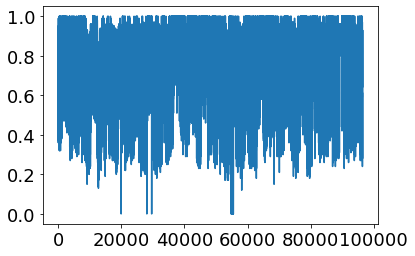

In [101]:
x = np.arange(data.shape[0])
plt.plot(x, data)

In [208]:
total_timesteps= 24
train_time_steps = 23
test_time_steps = total_timesteps - train_time_steps

In [209]:
data.shape[0]

96453

In [210]:
daily_data = []  
for i in range(0, data.shape[0], total_timesteps):
    daily_data.append(data[i:i+total_timesteps]) 
print(np.array(daily_data).shape)

(4019,)


/tmp/ipykernel_7911/1973323311.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(np.array(daily_data).shape)


In [211]:
train_test_ratio=0.9
batch_size = 128

In [212]:
length = int(len(daily_data)*train_test_ratio)
# random.shuffle(daily_data)
print(len(daily_data), length)
train_data = daily_data[0:length]
test_data= daily_data[length:-1]
train_data = np.array(train_data)
test_data = np.array(test_data)
print("Train and Test Data shapormalizing/standardizing:", train_data.shape, test_data.shape)

4019 3617
Train and Test Data shapormalizing/standardizing: (3617, 24, 1) (401, 24, 1)


**Train, Validate, Test Splits**

In [213]:
scaler=MinMaxScaler(feature_range=(0,1))
train_data=scaler.fit_transform(train_data.reshape(-1,1))

# scaler=StandardScaler()
# train_data=scaler.fit_transform(train_data.reshape(-1,1))

train_data = train_data.reshape(-1,total_timesteps)
print("Train Data shape after normalizing/standardizing:", train_data.shape)

test_data=scaler.transform(test_data.reshape(-1,1))

test_data = test_data.reshape(-1,total_timesteps)
print("Train and Test Data shape before normalizing/standardizing:", train_data.shape, test_data.shape)

print("Before Validation Data: train vs test", train_data.shape, test_data.shape)

length = int(len(train_data)*train_test_ratio)
# random.shuffle(train_data)
val_data= train_data[length:]
train_data = train_data[0:length]
print("After Validation Data (from train data): train vs validation vs test", train_data.shape, val_data.shape, test_data.shape)

Train Data shape after normalizing/standardizing: (3617, 24)
Train and Test Data shape before normalizing/standardizing: (3617, 24) (401, 24)
Before Validation Data: train vs test (3617, 24) (401, 24)
After Validation Data (from train data): train vs validation vs test (3255, 24) (362, 24) (401, 24)


In [214]:
# print("Before Validation Data: train vs test", train_data.shape, test_data.shape)

# length = int(len(train_data)*train_test_ratio)
# # random.shuffle(train_data)
# val_data= train_data[length:]
# train_data = train_data[0:length]
# print("After Validation Data (from train data): train vs validation vs test", train_data.shape, val_data.shape, test_data.shape)

**Data Preprocessing**

In [215]:
def create_X_data(dataset, time_step=1):
    dataX = []
    for i in range(len(dataset)):
        X_data = dataset[i][0:time_step]
        dataX.append(X_data)
    return np.array(dataX)

def ready_X_data(train_data, val_data, test_data, train_time_steps):
      X_train = create_X_data(train_data, train_time_steps)
      X_val = create_X_data(val_data, train_time_steps)
      X_test = create_X_data(test_data, train_time_steps) 
      # reshape input to be [samples, time steps, features] which is required for LSTM
      X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
      X_val =X_val.reshape(X_val.shape[0],X_val.shape[1] , 1)
      X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)
      
     
      return X_train, X_val , X_test
def create_y_data(dataset, time_step=1):
    dataY = []
    for i in range(len(dataset)):
        y_data = np.max(dataset[i][time_step:])
        dataY.append(y_data)
    return np.array(dataY)

def ready_y_data(train_data, val_data, test_data, train_time_steps):
      y_train = create_y_data(train_data, train_time_steps)
      y_val = create_y_data(val_data, train_time_steps)
      y_test = create_y_data(test_data, train_time_steps )
      y_train =y_train.reshape(-1 , 1)
      y_val =y_val.reshape(-1 , 1)
      y_test = y_test.reshape(-1, 1)

      return y_train.reshape(-1) , y_val.reshape(-1), y_test.reshape(-1) 

In [216]:
X_train, X_val, X_test = ready_X_data(train_data, val_data, test_data, train_time_steps)
y_train , y_val, y_test  = ready_y_data(train_data, val_data, test_data, train_time_steps)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((3255, 23, 1), (3255,), (401, 23, 1), (401,))

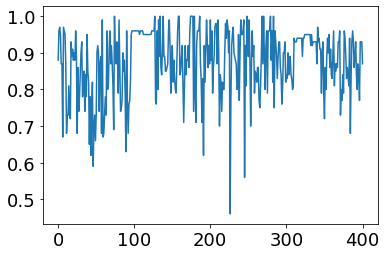

In [217]:
plt.plot(y_test)

# General Functions

In [218]:
def get_result(model, X_test, y_test, model_name="Test"): 
    print(f"Model - {model_name}:")
    
    predictions = model.predict(X_test)

    model_r2_score = r2_score(y_test, predictions)
    print("R^2 Score:",model_r2_score)
    predictions = predictions.reshape((predictions.shape[0]))
    print("RMSE:",  math.sqrt(mean_squared_error(y_test, predictions)))
    return model.predict(X_test)
def plot_predictions(test, predicted, yLabel="Test", realLabel="Test", predictedLabel="Test", title="Test", xLabel="Test"):
    plt.figure(figsize=(20,8))
    plt.rcParams.update({'font.size': 18})
    plt.plot(test, color='red',label=realLabel)
    plt.plot(predicted, alpha=0.7, color='blue',label=predictedLabel)
    plt.title(title)
    plt.xlabel(xLabel)
    plt.ylabel(yLabel)
    plt.legend()
    plt.show()

### Models in Functions

In [219]:
n_hidden_first = 50

In [220]:
def lstm(X_train,y_train):
    # build LSTM model
    lstm_model = Sequential()

    lstm_model.add(LSTM(n_hidden_first,return_sequences=False,activation="relu", input_shape=(X_train.shape[1],1)))
    lstm_model.add(Dropout(0.15))
    # lstm_model.add(LSTM(10, return_sequences=False))
    # lstm_model.add(Dropout(0.2))

    lstm_model.add(Dense(1))

    lstm_model.summary()

    # train LSTM model
    lstm_model.compile(optimizer="adam",loss="MSE")
    lstm_model.fit(X_train, y_train, epochs=40)
    return lstm_model

In [221]:
def stacked_lstm(X_train,y_train):
# build Stacked_LSTM model
    s_lstm_model = Sequential()

    s_lstm_model.add(LSTM(n_hidden_first,return_sequences=True,activation="relu", input_shape=(X_train.shape[1],1)))
    s_lstm_model.add(Dropout(0.15))
    s_lstm_model.add(LSTM(30, return_sequences=True))
    s_lstm_model.add(Dropout(0.2))
    s_lstm_model.add(LSTM(10, return_sequences=False))
    s_lstm_model.add(Dropout(0.2))
    s_lstm_model.add(Dense(1))
    s_lstm_model.summary()

    s_lstm_model.compile(optimizer="adam",loss="MSE")
    s_lstm_model.fit(X_train, y_train, epochs=40)
    return s_lstm_model

In [222]:
def gru(X_train,y_train):
    # build GRU model
    gru_model = Sequential()

    gru_model.add(GRU(n_hidden_first,activation="tanh", input_shape=(X_train.shape[1],1)))
    gru_model.add(Dropout(0.15))

    gru_model.add(Dense(1))

    gru_model.summary()

    gru_model.compile(optimizer="adam",loss="MSE")
    gru_model.fit(X_train, y_train, epochs=40)
    return gru_model

In [223]:
def rnn(X_train,y_train):
    rnn_model = Sequential()

    rnn_model.add(SimpleRNN(n_hidden_first,activation="tanh", input_shape=(X_train.shape[1],1)))
    rnn_model.add(Dropout(0.15))

    rnn_model.add(Dense(1))

    rnn_model.summary()

    rnn_model.compile(optimizer="adam",loss="MSE")
    rnn_model.fit(X_train, y_train, epochs=40)
    return rnn_model


In [197]:
def cnn(X_train,y_train):
    cnn_model = Sequential()
    cnn_model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1],1)))
    cnn_model.add(MaxPooling1D(pool_size=2))
    cnn_model.add(Flatten())
    cnn_model.add(Dense(10, activation='relu'))
    cnn_model.add(Dense(1))
    cnn_model.summary()
    cnn_model.compile(optimizer='adam', loss='mse')



    cnn_model.compile(optimizer="adam",loss="MSE")
    cnn_model.fit(X_train, y_train, epochs=40)
    return cnn_model

In [198]:
def cnn_lstm(X_train,y_train):
    n_seq = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, X_train.shape[1], 1))

    cnn_lstm_model = Sequential()
    cnn_lstm_model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, X_train.shape[1],1)))
    cnn_lstm_model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
    cnn_lstm_model.add(TimeDistributed(Flatten()))
    cnn_lstm_model.add(LSTM(20, activation='relu'))
    cnn_lstm_model.add(Dense(1))

    cnn_lstm_model.summary()
    cnn_lstm_model.compile(optimizer='adam', loss='mse')


    cnn_lstm_model.compile(optimizer="adam",loss="MSE")
    cnn_lstm_model.fit(X_train_reshaped, y_train, epochs=40)
    return cnn_lstm_model

In [195]:
def convlstm(X_train,y_train):
    n_seq = 1
    n_features = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, 1, X_train.shape[1], n_features))

    conv_lstm_model = Sequential()
    conv_lstm_model.add(ConvLSTM2D(filters=64, kernel_size=(1,2), activation='relu', input_shape=(n_seq, 1, X_train.shape[1], n_features)))
    conv_lstm_model.add(Flatten())
    conv_lstm_model.add(Dense(1))
    conv_lstm_model.summary()

    conv_lstm_model.compile(optimizer="adam",loss="MSE")
    conv_lstm_model.fit(X_train_reshaped, y_train, epochs=40)
    return conv_lstm_model


# Training and fitting models

In [125]:
yLabel="Humidity"
realLabel="Actual Humidity"
predictedLabel="Predicted Humidity"

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_28 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_31 (Dropout)        (None, 50)                0         
                                                                 
 dense_23 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
102/102 [==============================] - 2s 10ms/step - loss: 0.1196
Epoch 2/40
102/102 [==============================] - 1s 9ms/step - loss: 0.0150
Epoch 3/40
102/102 [==============================] - 1s 10ms/step - loss: 0.0140
Epoch 4/40
102/102 [==============================] - 1s 8ms/step - 

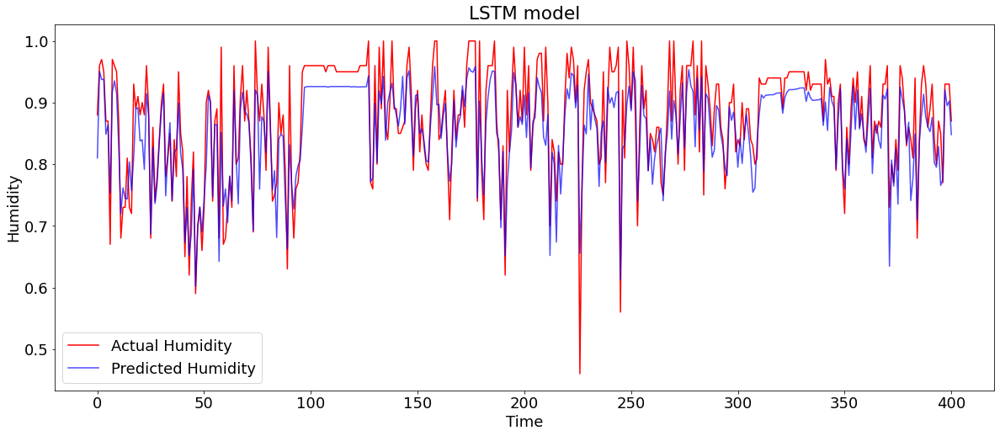

In [224]:
# build LSTM model
lstm_model=lstm(X_train,y_train)
lstm_predictions = get_result(lstm_model, X_test, y_test, "LSTM")
plot_predictions(y_test, lstm_predictions, yLabel, realLabel, predictedLabel, "LSTM model", xLabel="Time")

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_29 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_32 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_30 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_33 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_31 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_34 (Dropout)        (None, 10)                0         
                                                                 
 dense_24 (Dense)            (None, 1)               

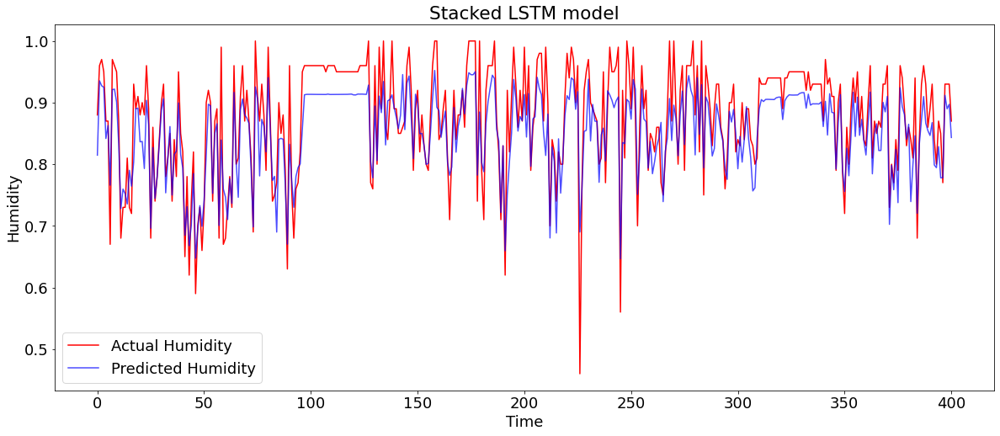

In [225]:
# build Stacked_LSTM model
s_lstm_model = stacked_lstm(X_train,y_train)

s_lstm_predictions = get_result(s_lstm_model, X_test, y_test, "Stacked LSTM")
plot_predictions(y_test, s_lstm_predictions, yLabel, realLabel, predictedLabel, "Stacked LSTM model", xLabel="Time")

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_2 (GRU)                 (None, 50)                7950      
                                                                 
 dropout_35 (Dropout)        (None, 50)                0         
                                                                 
 dense_25 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
102/102 [==============================] - 3s 10ms/step - loss: 0.0538
Epoch 2/40
102/102 [==============================] - 1s 10ms/step - loss: 0.0095
Epoch 3/40
102/102 [==============================] - 2s 15ms/step - loss: 0.0083
Epoch 4/40
102/102 [==============================] - 1s 11ms/step - 

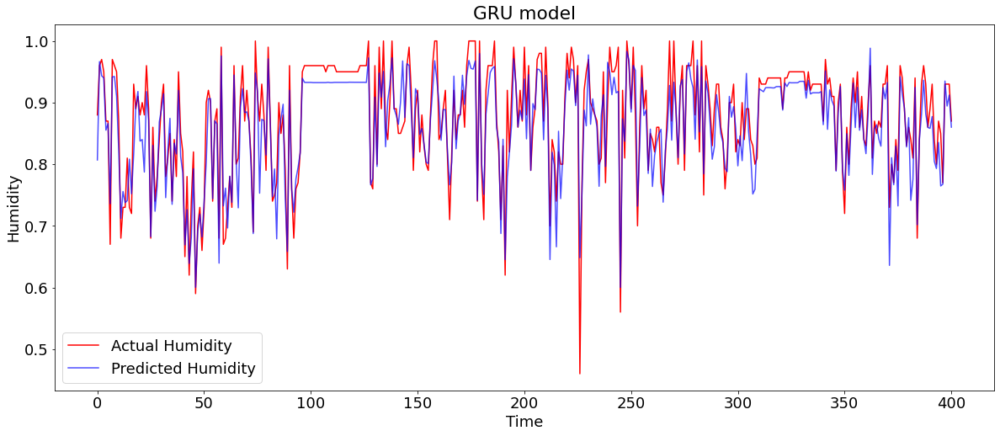

In [226]:
gru_model=gru(X_train,y_train)
gru_predictions = get_result(gru_model, X_test, y_test, "GRU")
plot_predictions(y_test, gru_predictions, yLabel, realLabel, predictedLabel, "GRU model", xLabel="Time" )

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_2 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_36 (Dropout)        (None, 50)                0         
                                                                 
 dense_26 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
102/102 [==============================] - 1s 6ms/step - loss: 0.0832
Epoch 2/40
102/102 [==============================] - 1s 6ms/step - loss: 0.0133
Epoch 3/40
102/102 [==============================] - 1s 6ms/step - loss: 0.0098
Epoch 4/40
102/102 [==============================] - 1s 6ms/step - loss

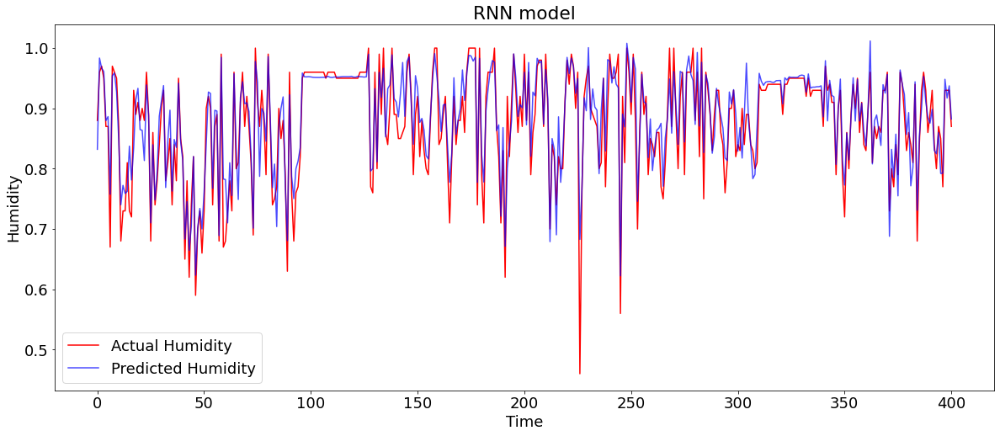

In [227]:
# build RNN model
rnn_model=rnn(X_train,y_train)
rnn_predictions = get_result(rnn_model, X_test, y_test, "RNN")
plot_predictions(y_test, rnn_predictions, yLabel, realLabel, predictedLabel, "RNN model", xLabel="Time"   )


Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 704)               0         
                                                                 
 dense_27 (Dense)            (None, 10)                7050      
                                                                 
 dense_28 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

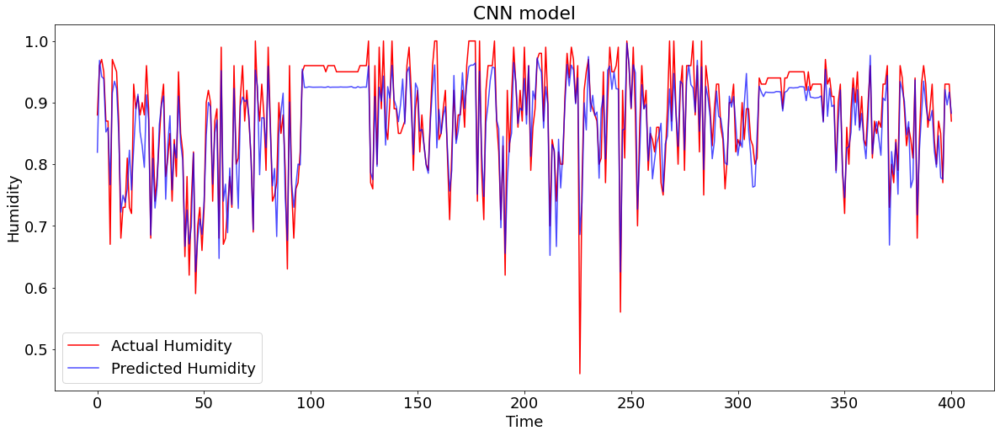

In [228]:
# build CNN model
cnn_model=cnn(X_train,y_train)
cnn_predictions = get_result(cnn_model, X_test, y_test, "CNN")
plot_predictions(y_test, cnn_predictions, yLabel, realLabel, predictedLabel, "CNN model", xLabel="Time" )

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, None, 23, 64)     128       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_32 (LSTM)              (None, 20)                58000     
                                                                 
 dense_29 (Dense)            (None, 1)                 21        
                                                     

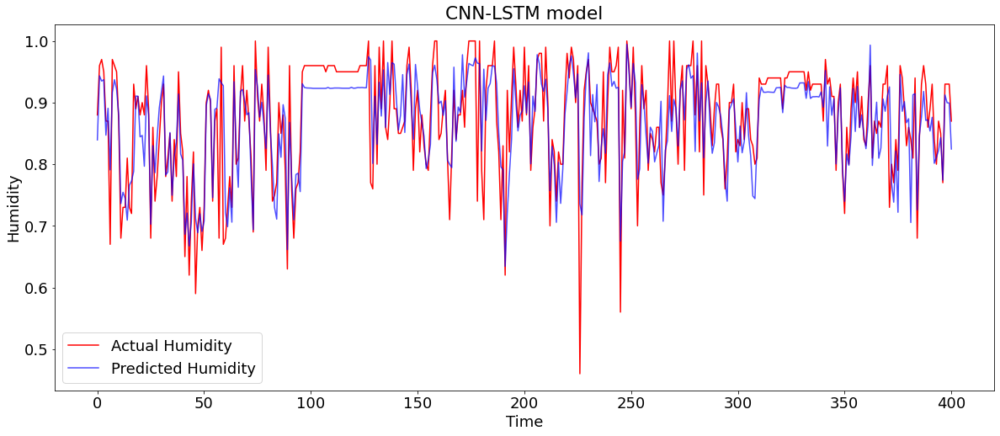

In [229]:
# build CNN-LSTM model
n_seq=1
cnn_lstm_model=cnn_lstm(X_train,y_train)
cnn_lstm_predictions = get_result(cnn_lstm_model, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnn_lstm_predictions, yLabel, realLabel, predictedLabel, "CNN-LSTM model", xLabel="Time",  )


Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 22, 64)         33536     
                                                                 
 flatten_3 (Flatten)         (None, 1408)              0         
                                                                 
 dense_30 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
102/102 [==============================] - 3s 8ms/step - loss: 0.1138
Epoch 2/40
102/102 [==============================] - 1s 8ms/step - loss: 0.0077
Epoch 3/40
102/102 [==============================] - 1s 8ms/step - loss: 0.0075
Epoch 4/40
102/102 [==============================] - 1s 13ms/step - l

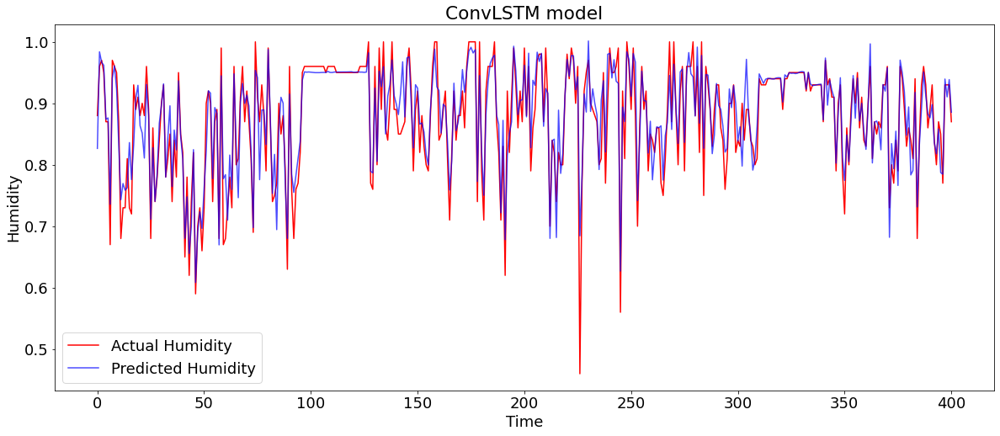

In [230]:
# build ConvLSTM model
n_seq=1
n_features = 1
conv_lstm_model=convlstm(X_train,y_train)

conv_lstm_predictions = get_result(conv_lstm_model, X_test.reshape((X_test.shape[0], n_seq, 1, X_test.shape[1], n_features)), y_test, "ConvLSTM")
plot_predictions(y_test, conv_lstm_predictions, yLabel, realLabel, predictedLabel, "ConvLSTM model", xLabel="Time"   )


# Adversarial Attacks

## Attack Functions

In [232]:
def signed_gradient(X_test, y): 
    X_tf = tf.convert_to_tensor(X_test, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(X_tf)
        lossFunction = mean_squared_error(X_tf, y.reshape(-1))
    gradientFunction = tape.gradient(lossFunction, X_tf)
    signed_grad = tf.sign(gradientFunction)
    return signed_grad.numpy()

def fgsm(X_test, y, epsilon=0.1):
    signed_grad = signed_gradient(X_test, y)
    X_perturbed = X_test + epsilon * signed_grad
    return X_perturbed

def bim(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test.copy()
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
       
        return X_perturbed
def pgd(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test + np.random.uniform(-epsilon,epsilon,X_test.shape)
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
        
        
        return X_perturbed

## Attacks on Models

In [255]:
epsilon = 0.2
alpha = 0.2

### Attacks on LSTM

Model - FGSM perturbed LSTM:
R^2 Score: -1.0715354085681517
RMSE: 0.12870345636602779


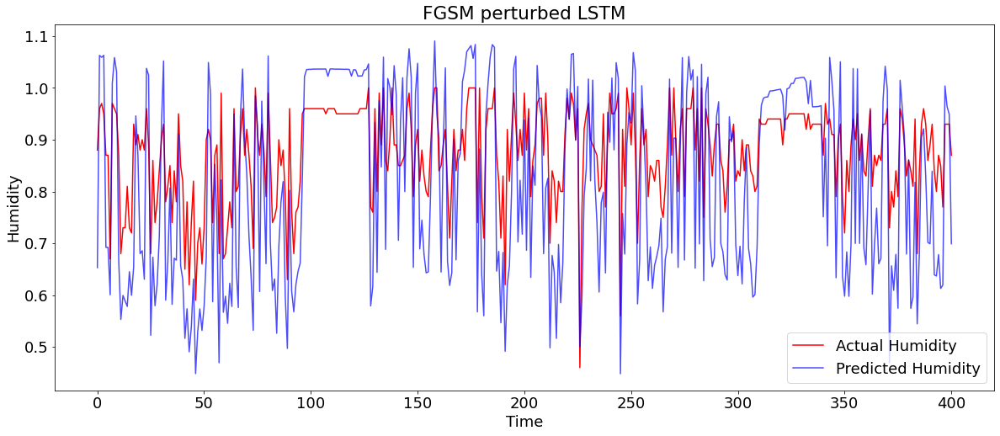

In [256]:
X_fgsm_perturbed_lstm = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_lstm = get_result(lstm_model, X_fgsm_perturbed_lstm, y_test, "FGSM perturbed LSTM")
plot_predictions(y_test, fgsm_predictions_lstm, yLabel, realLabel, predictedLabel, "FGSM perturbed LSTM", xLabel="Time")

In [257]:
# run this to show intermediate results
# bim(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only = False)

Model - BIM perturbed LSTM:
R^2 Score: -1.0715353997833144
RMSE: 0.12870345636602779


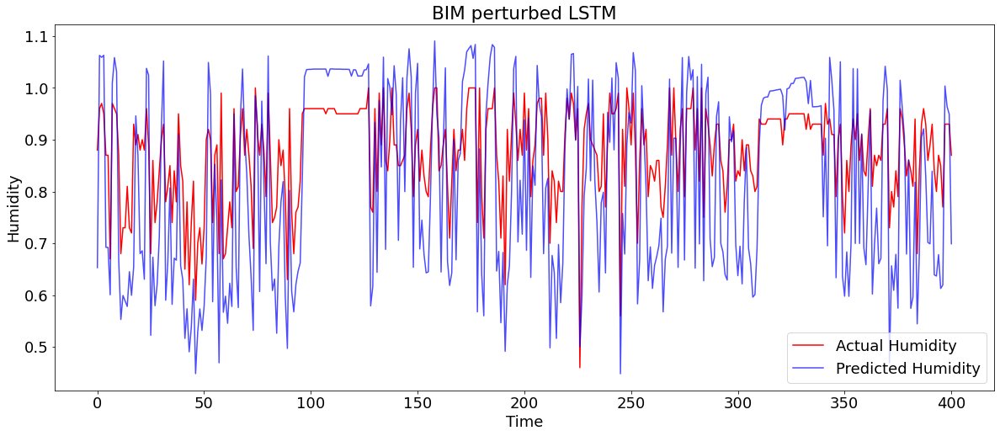

In [258]:
X_bim_perturbed_lstm = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_lstm = get_result(lstm_model, X_bim_perturbed_lstm, y_test, "BIM perturbed LSTM")
plot_predictions(y_test, bim_predictions_lstm, yLabel, realLabel, predictedLabel, "BIM perturbed LSTM", xLabel="Time")

In [259]:
# run this to show intermediate results
# pgd(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only =False)

Model - PGD perturbed LSTM:
R^2 Score: -0.8288768238941833
RMSE: 0.1209306117925138


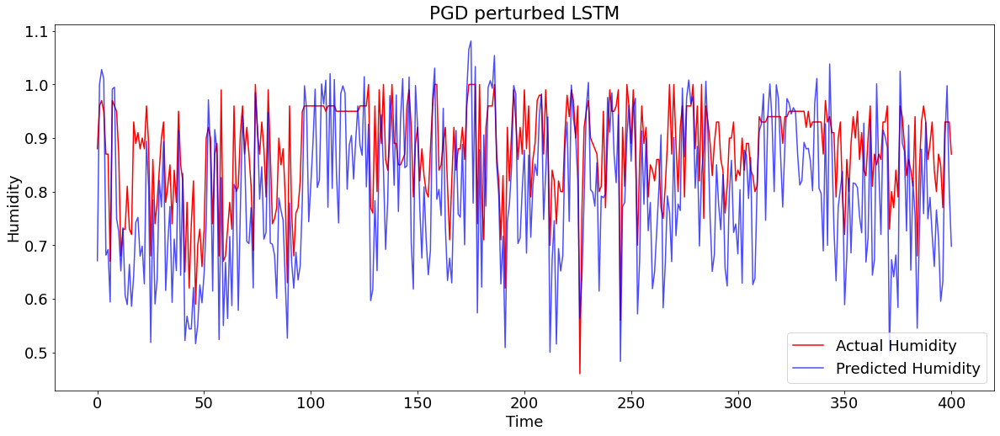

In [260]:
X_pgd_perturbed_lstm = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_lstm = get_result(lstm_model, X_pgd_perturbed_lstm, y_test, "PGD perturbed LSTM")
plot_predictions(y_test, pgd_predictions_lstm, yLabel, realLabel, predictedLabel, "PGD perturbed LSTM", xLabel="Time")

### Attacks on Stacked LSTM

Model - FGSM perturbed Stacked LSTM:
R^2 Score: -0.7056948485109362
RMSE: 0.11678704743519638


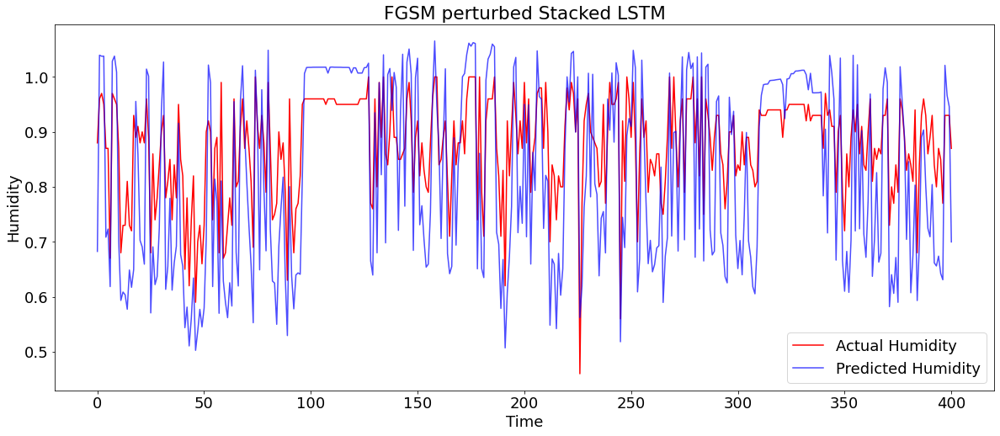

In [261]:
X_fgsm_perturbed_stlstm = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_stlstm = get_result(s_lstm_model, X_fgsm_perturbed_stlstm, y_test, "FGSM perturbed Stacked LSTM")
plot_predictions(y_test, fgsm_predictions_stlstm, yLabel, realLabel, predictedLabel,  "FGSM perturbed Stacked LSTM", xLabel="Time")

Model - BIM perturbed Stacked LSTM:
R^2 Score: -0.7056947911068108
RMSE: 0.11678704743519638


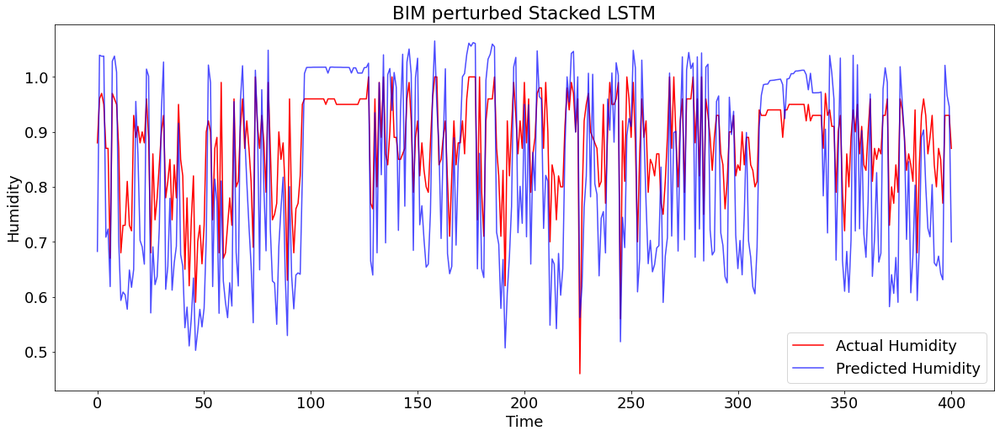

In [262]:

X_bim_perturbed_stlstm = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_stlstm = get_result(s_lstm_model, X_bim_perturbed_stlstm, y_test, "BIM perturbed Stacked LSTM")
plot_predictions(y_test, bim_predictions_stlstm, yLabel, realLabel, predictedLabel, "BIM perturbed Stacked LSTM", xLabel="Time",)


Model - PGD perturbed Stacked LSTM:
R^2 Score: -0.3561497526703903
RMSE: 0.10413526916181833


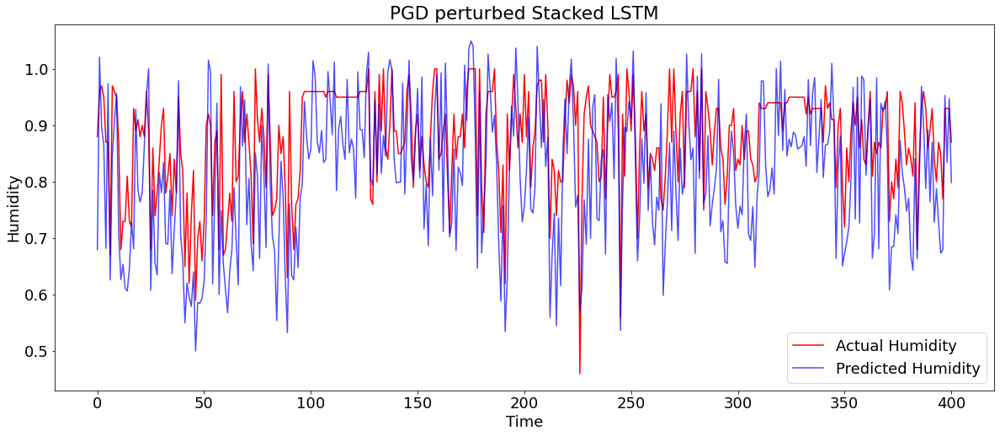

In [263]:
X_pgd_perturbed_stlstm = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_stlstm = get_result(s_lstm_model, X_pgd_perturbed_stlstm, y_test, "PGD perturbed Stacked LSTM")
plot_predictions(y_test, pgd_predictions_stlstm, yLabel, realLabel, predictedLabel, "PGD perturbed Stacked LSTM", xLabel="Time" )

### Attacks on GRU

Model - FGSM perturbed GRU:
R^2 Score: -2.301301594185735
RMSE: 0.16247503565717294


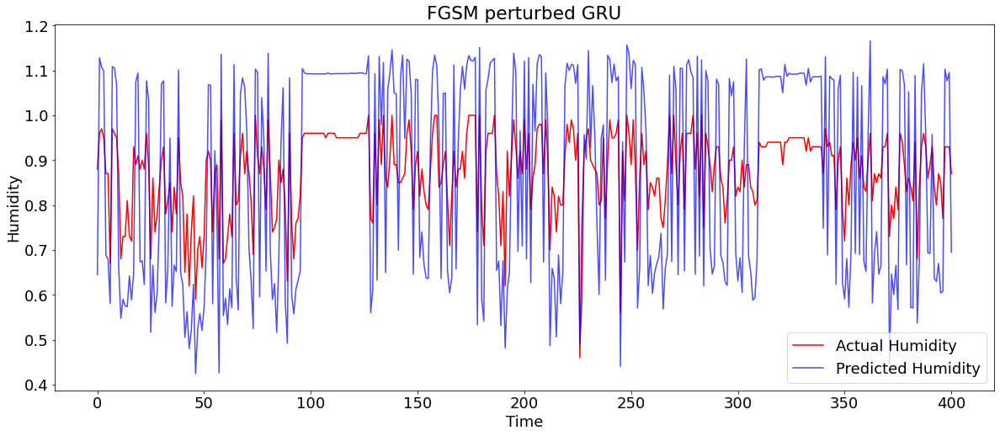

In [264]:
# need to copy the same things above
# replace the variable names carefully
X_fgsm_perturbed_gru = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_gru = get_result(gru_model, X_fgsm_perturbed_gru, y_test, "FGSM perturbed GRU")
plot_predictions(y_test, fgsm_predictions_gru, yLabel, realLabel, predictedLabel, "FGSM perturbed GRU", xLabel="Time" )

Model - BIM perturbed GRU:
R^2 Score: -2.3013015800706533
RMSE: 0.16247503565717294


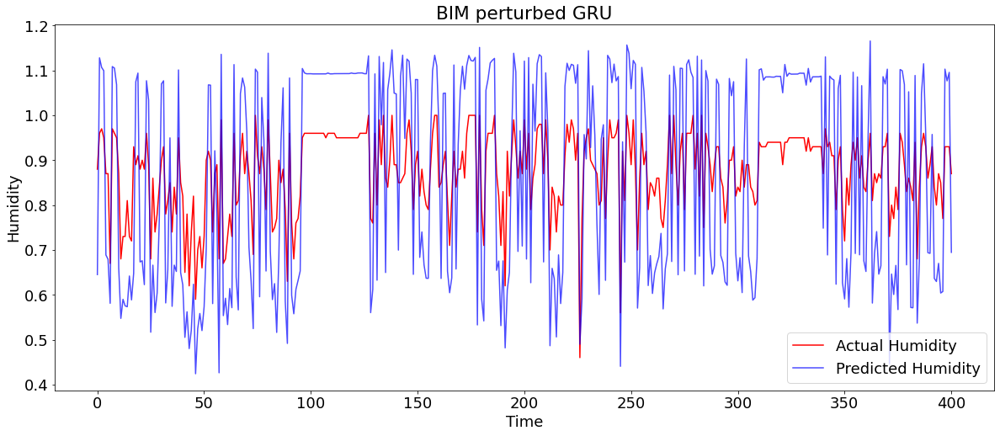

In [265]:

X_bim_perturbed_gru = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_gru = get_result(gru_model, X_bim_perturbed_gru, y_test, "BIM perturbed GRU")
plot_predictions(y_test, bim_predictions_gru, yLabel, realLabel, predictedLabel, "BIM perturbed GRU", xLabel="Time" )


Model - PGD perturbed GRU:
R^2 Score: -1.4628950832436804
RMSE: 0.1403353078163655


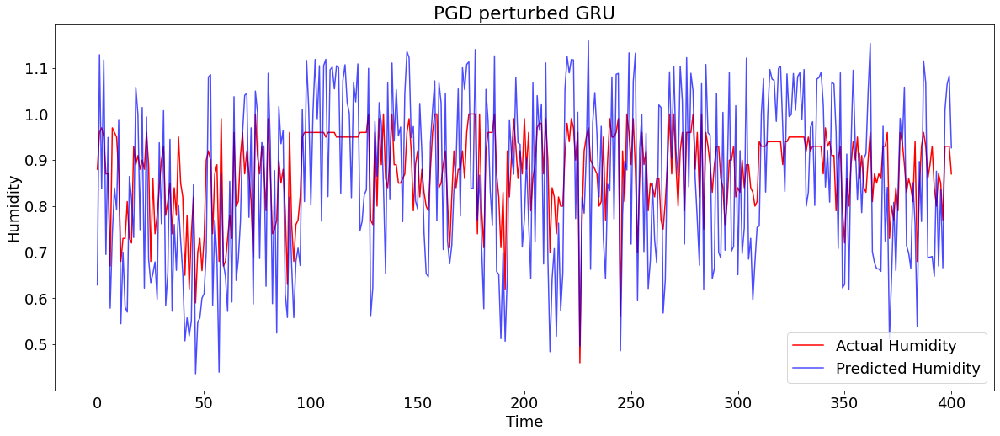

In [266]:
X_pgd_perturbed_gru = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_gru = get_result(gru_model, X_pgd_perturbed_gru, y_test, "PGD perturbed GRU")
plot_predictions(y_test, pgd_predictions_gru, yLabel, realLabel, predictedLabel, "PGD perturbed GRU", xLabel="Time" )

### Attacks on RNN

In [267]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed RNN:
R^2 Score: -2.363112780670146
RMSE: 0.16398901088208168


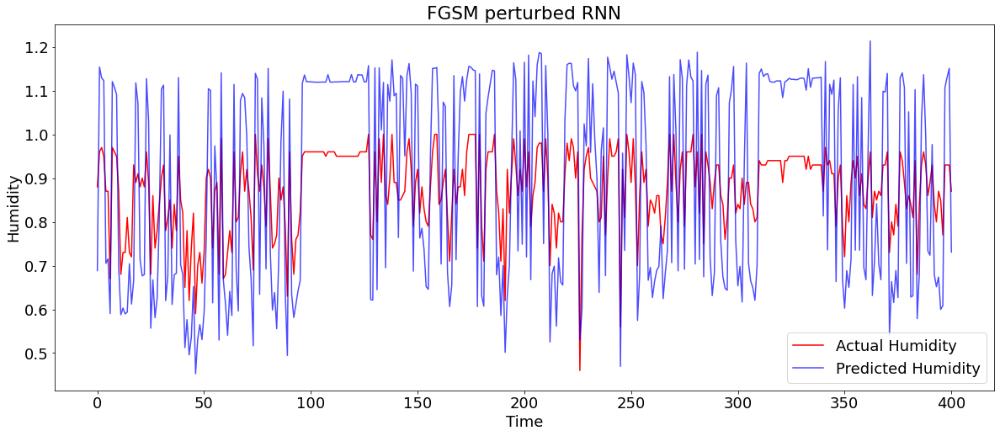

In [268]:
X_fgsm_perturbed_rnn = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_rnn = get_result(rnn_model, X_fgsm_perturbed_rnn, y_test, "FGSM perturbed RNN")
plot_predictions(y_test, fgsm_predictions_rnn, yLabel, realLabel, predictedLabel, "FGSM perturbed RNN", xLabel="Time" )

Model - BIM perturbed RNN:
R^2 Score: -2.363112834884599
RMSE: 0.16398901088208168


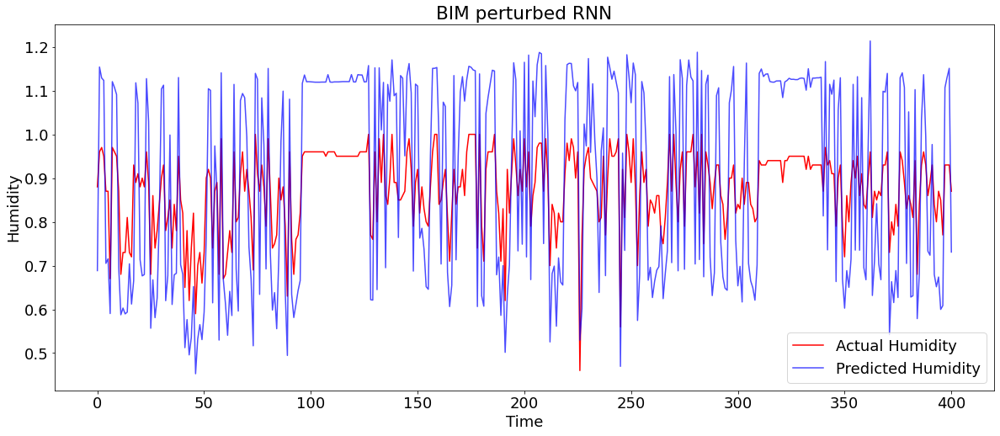

In [269]:
X_bim_perturbed_rnn = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_rnn = get_result(rnn_model, X_bim_perturbed_rnn, y_test, "BIM perturbed RNN")
plot_predictions(y_test, bim_predictions_rnn, yLabel, realLabel, predictedLabel, "BIM perturbed RNN", xLabel="Time" )


Model - PGD perturbed RNN:
R^2 Score: -1.2533772747005094
RMSE: 0.13423352306763006


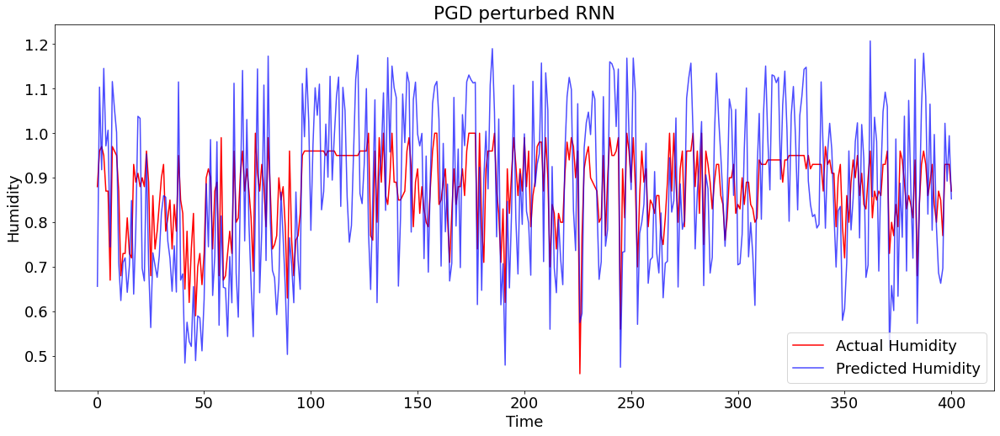

In [270]:
X_pgd_perturbed_rnn = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_rnn = get_result(rnn_model, X_pgd_perturbed_rnn, y_test, "PGD perturbed RNN")
plot_predictions(y_test, pgd_predictions_rnn, yLabel, realLabel, predictedLabel, "PGD perturbed RNN", xLabel="Time" )

### Attacks on CNN

In [271]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed CNN:
R^2 Score: -1.5179850070965184
RMSE: 0.14189614533295936


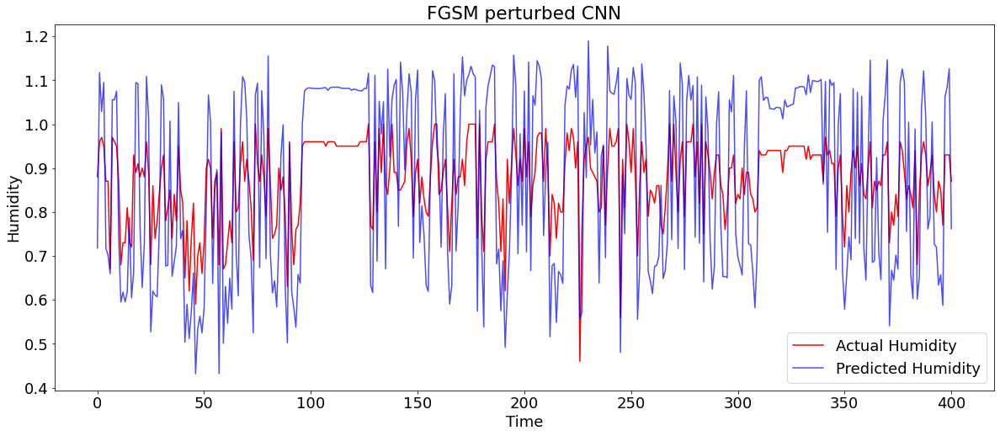

In [272]:
X_fgsm_perturbed_cnn = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_cnn = get_result(cnn_model, X_fgsm_perturbed_cnn, y_test, "FGSM perturbed CNN")
plot_predictions(y_test, fgsm_predictions_cnn, yLabel, realLabel, predictedLabel, "FGSM perturbed CNN", xLabel="Time" )

Model - BIM perturbed CNN:
R^2 Score: -1.5179849957496971
RMSE: 0.14189614533295936


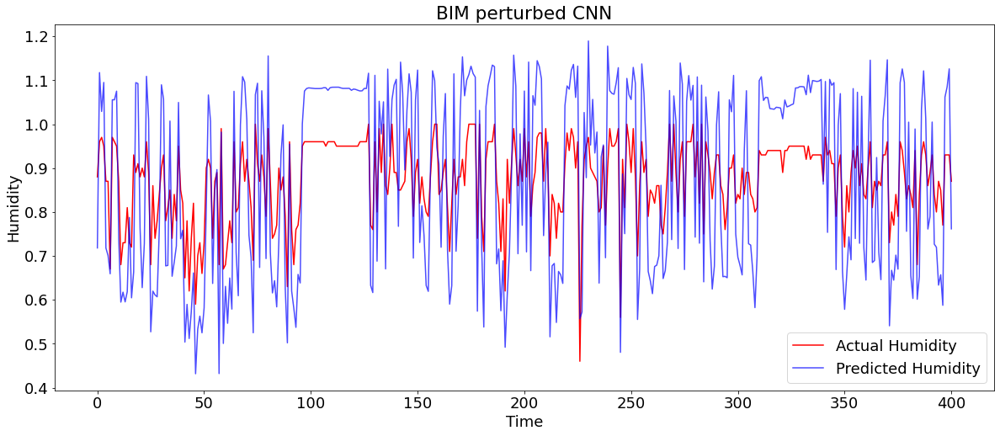

In [274]:
X_bim_perturbed_cnn = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_cnn = get_result(cnn_model, X_bim_perturbed_cnn, y_test, "BIM perturbed CNN")
plot_predictions(y_test, bim_predictions_cnn, yLabel, realLabel, predictedLabel, "BIM perturbed CNN", xLabel="Time" )


Model - PGD perturbed CNN:
R^2 Score: -0.8330903000648648
RMSE: 0.12106983656259532


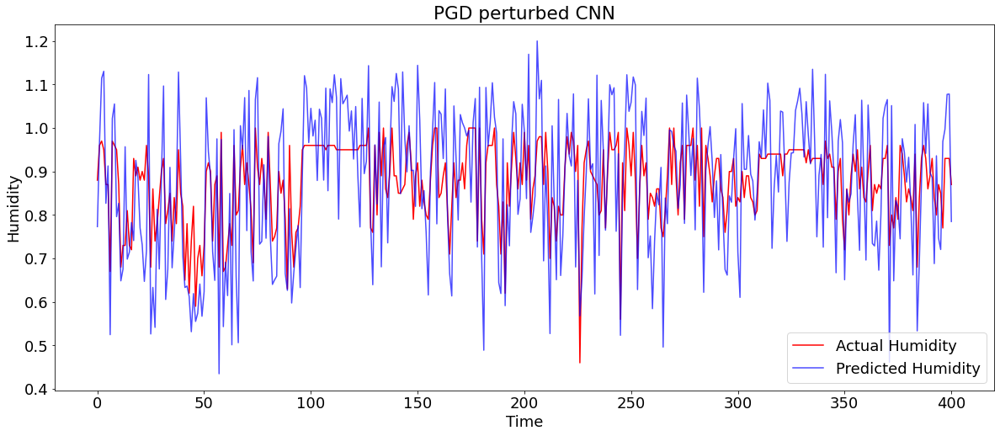

In [277]:
X_pgd_perturbed_cnn = pgd(5, epsilon, alpha,X_test, y_test)
pgd_predictions_cnn = get_result(cnn_model, X_pgd_perturbed_cnn, y_test, "PGD perturbed CNN")
plot_predictions(y_test, pgd_predictions_cnn, yLabel, realLabel, predictedLabel, "PGD perturbed CNN", xLabel="Time")

### Attacks on CNN-LSTM

Model - CNN-LSTM:
R^2 Score: -2.9876306551988554
RMSE: 0.17856711974224768


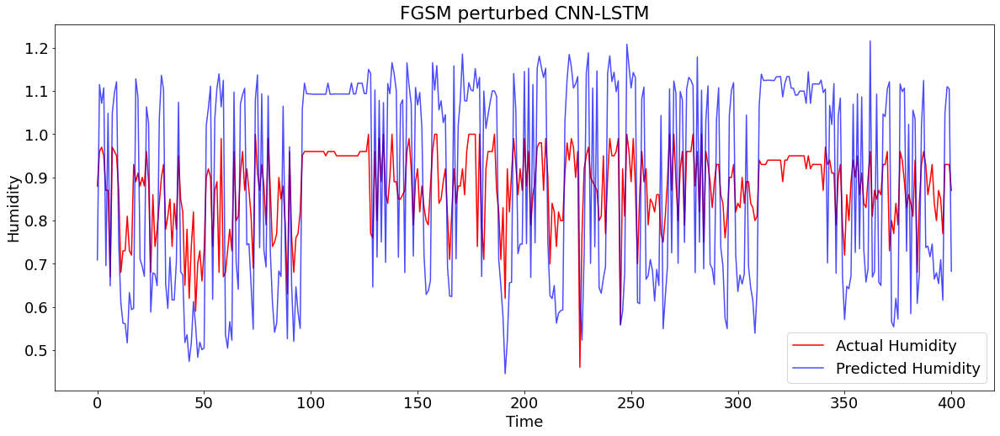

In [278]:
X_fgsm_perturbed_cnnlstm = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_cnnlstm = get_result(cnn_lstm_model, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_fgsm_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, fgsm_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "FGSM perturbed CNN-LSTM", xLabel="Time")

Model - BIM CNN-LSTM:
R^2 Score: -2.9876306433844455
RMSE: 0.17856711974224768


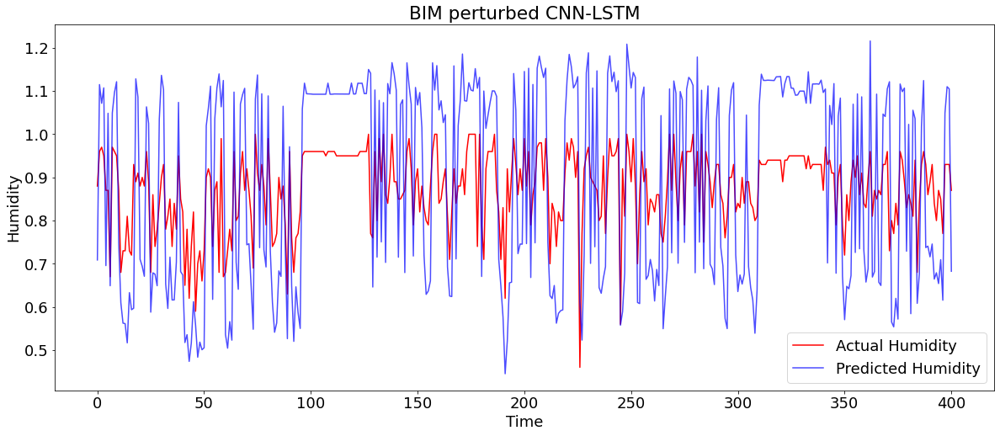

In [279]:
X_bim_perturbed_cnnlstm = bim(5, epsilon, alpha,X_test, y_test) 
bim_predictions_cnnlstm = get_result(cnn_lstm_model, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "BIM CNN-LSTM")
plot_predictions(y_test, bim_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "BIM perturbed CNN-LSTM", xLabel="Time")

Model - PGD CNN-LSTM:
R^2 Score: -2.2262261613992207
RMSE: 0.160616967987485


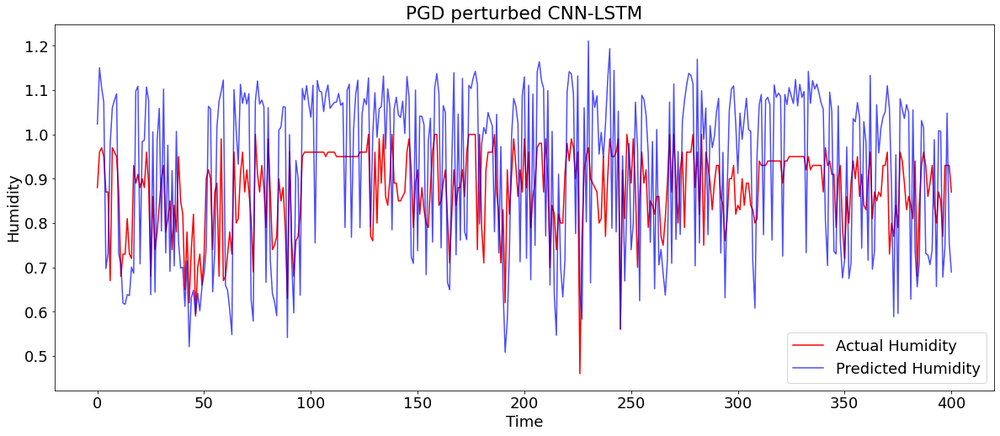

In [280]:
X_pgd_perturbed_cnnlstm = pgd(5,  epsilon, alpha, X_test, y_test) 
pgd_predictions_cnnlstm = get_result(cnn_lstm_model, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "PGD CNN-LSTM")
plot_predictions(y_test, pgd_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "PGD perturbed CNN-LSTM", xLabel="Time" )

### Attacks on ConvLSTM

Model - Conv-LSTM:
R^2 Score: -1.4582919435692467
RMSE: 0.14020411767993976


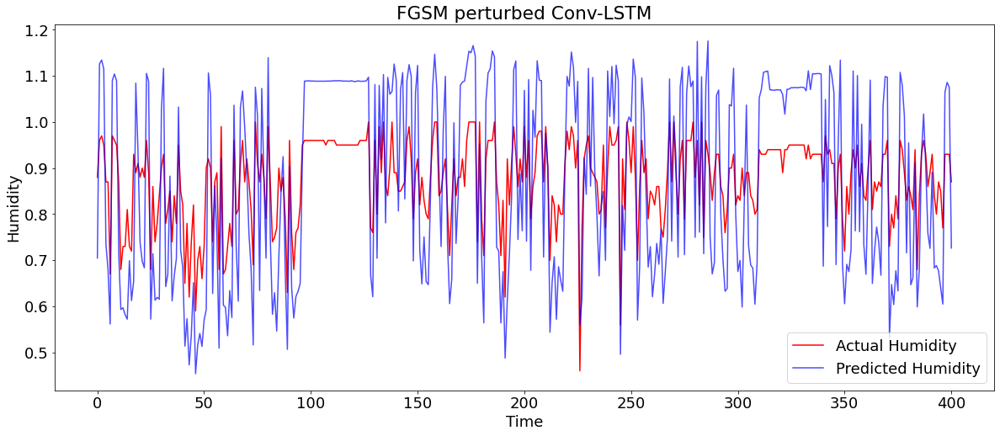

In [281]:
X_fgsm_perturbed_convlstm = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_convlstm = get_result(conv_lstm_model, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_fgsm_perturbed_convlstm.shape[1], 1)), y_test, "Conv-LSTM")
plot_predictions(y_test, fgsm_predictions_convlstm, yLabel, realLabel, predictedLabel,  "FGSM perturbed Conv-LSTM", xLabel="Time" )

Model - BIM ConvLSTM:
R^2 Score: -1.4582919206159173
RMSE: 0.14020411103732033


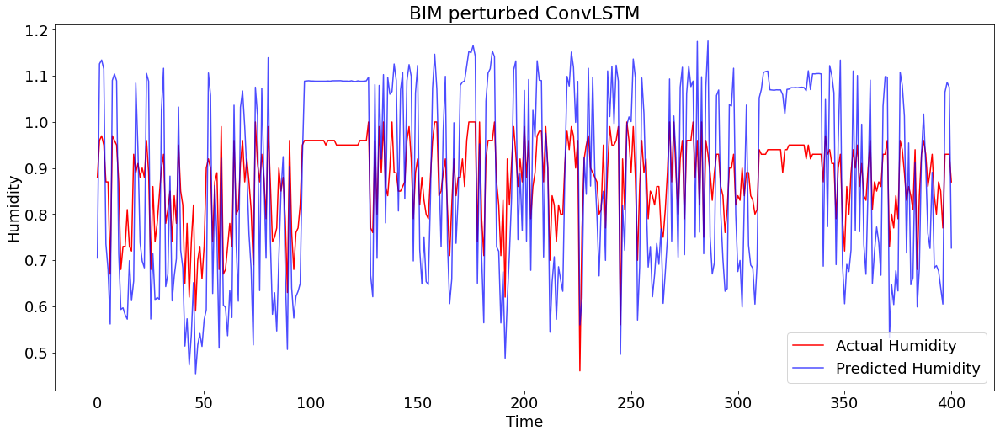

In [282]:
X_bim_perturbed_convlstm = bim(5, epsilon, alpha, X_test, y_test) 
bim_predictions_convlstm = get_result(conv_lstm_model, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "BIM ConvLSTM")
plot_predictions(y_test, bim_predictions_convlstm, yLabel, realLabel, predictedLabel, "BIM perturbed ConvLSTM", xLabel="Time")

Model - PGD ConvLSTM:
R^2 Score: -1.1091087757584024
RMSE: 0.12986542291319608


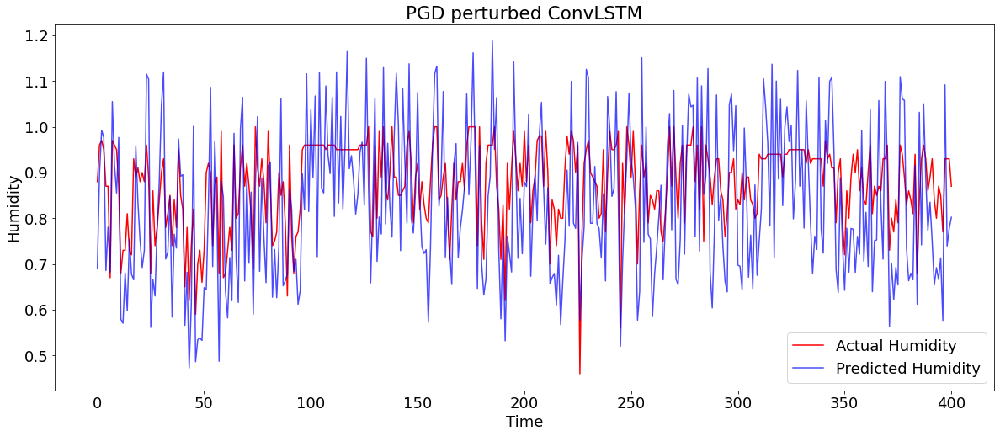

In [284]:
X_pgd_perturbed_convlstm = pgd(5,  epsilon, alpha, X_test, y_test) 
pgd_predictions_convlstm = get_result(conv_lstm_model, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "PGD ConvLSTM")
plot_predictions(y_test, pgd_predictions_convlstm, yLabel, realLabel, predictedLabel, "PGD perturbed ConvLSTM", xLabel="Time")

## Adversarial Learning

In [285]:
new_Y=np.concatenate((y_train,y_train))

In [286]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_lstm=lstm(X_new_fgsm,new_Y)

2022-04-23 08:02:37.042187: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 08:02:37.621203: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 08:02:37.908375: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 08:02:38.352523: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 08:02:38.692415: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.


Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_33 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_37 (Dropout)        (None, 50)                0         
                                                                 
 dense_31 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 3s 10ms/step - loss: 0.0636
Epoch 2/40
204/204 [==============================] - 2s 9ms/step - loss: 0.0126
Epoch 3/40
204/204 [==============================] - 2s 11ms/step - loss: 0.0120
Epoch 4/40
204/204 [==============================] - 2s 9ms/step - 

Model - FGSM-LSTM:
R^2 Score: 0.6881242843511475
RMSE: 0.04993841972417216


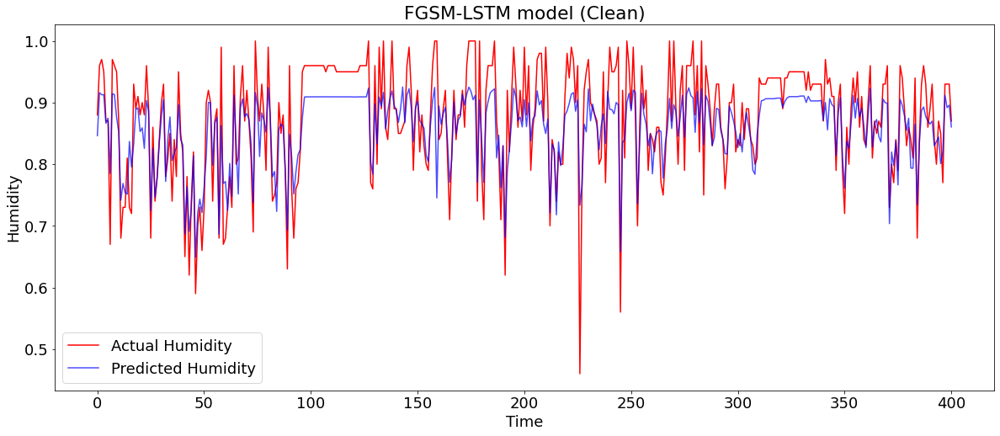

In [287]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_test, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-LSTM model (Clean)", xLabel="Time" )

Model - FGSM-LSTM:
R^2 Score: 0.172209815004275
RMSE: 0.08135873002495748


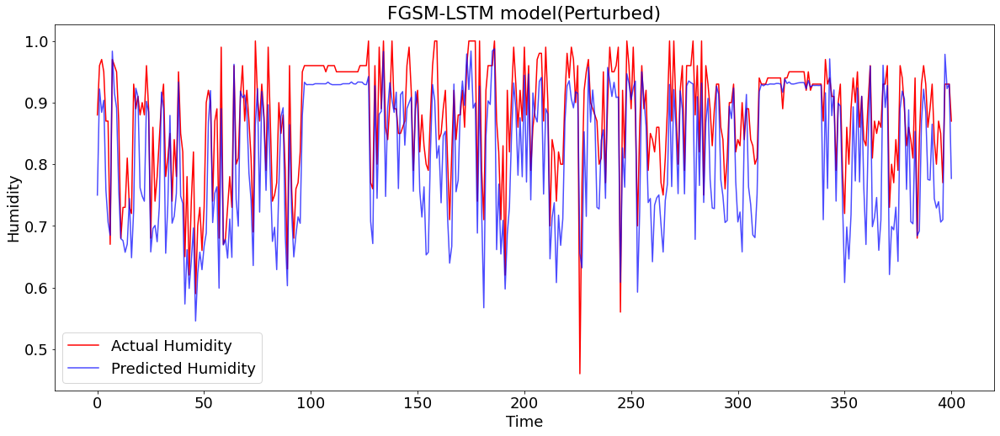

In [288]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_fgsm_perturbed_lstm, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-LSTM model(Perturbed)", xLabel="Time" )

In [289]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_lstm=lstm(X_new_bim,new_Y)


Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_34 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_38 (Dropout)        (None, 50)                0         
                                                                 
 dense_32 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 3s 9ms/step - loss: 0.0422
Epoch 2/40
204/204 [==============================] - 2s 11ms/step - loss: 0.0119
Epoch 3/40
204/204 [==============================] - 2s 9ms/step - loss: 0.0114
Epoch 4/40
204/204 [==============================] - 2s 11ms/step - 

Model - BIM-LSTM:
R^2 Score: 0.7568359393600422
RMSE: 0.04409543990824447


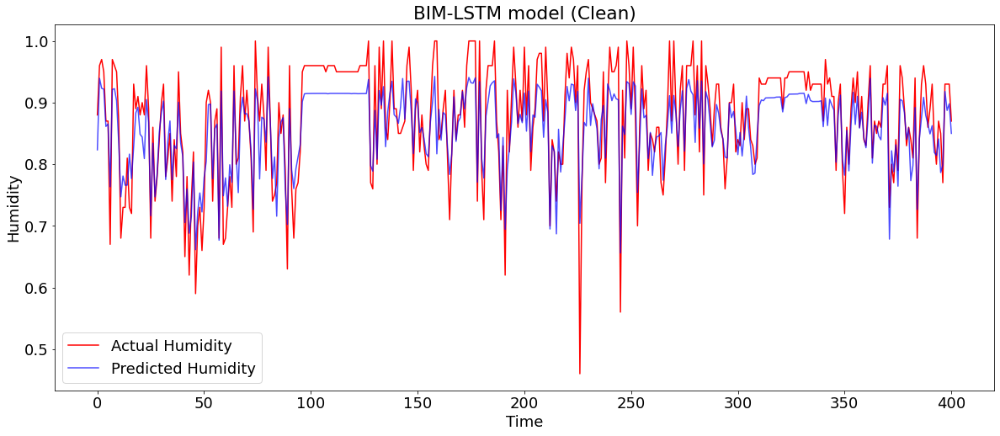

In [290]:

lstm_bim_predictions=get_result(bim_lstm, X_test, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-LSTM model (Clean)", xLabel="Time" )

Model - BIM-LSTM:
R^2 Score: -0.455217370363558
RMSE: 0.10787180827641649


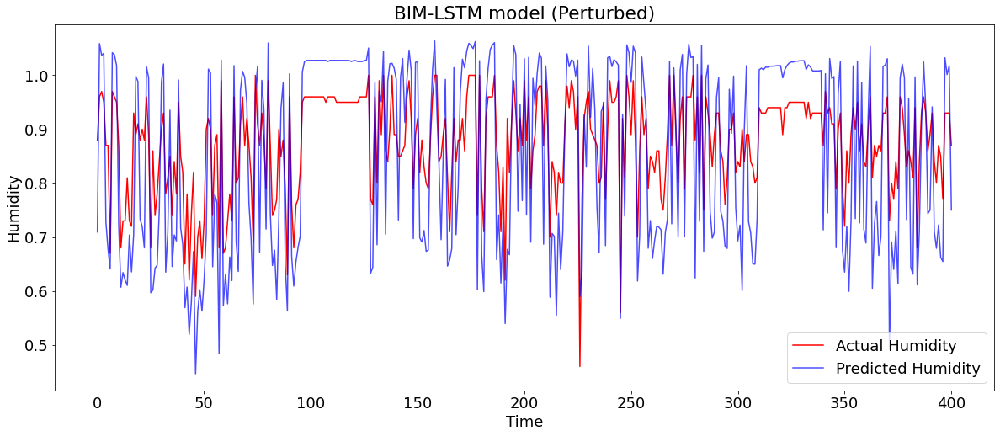

In [291]:

lstm_bim_predictions=get_result(bim_lstm, X_bim_perturbed_lstm, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-LSTM model (Perturbed)", xLabel="Time" )


In [292]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_lstm=lstm(X_new_pgd,new_Y)

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_35 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_39 (Dropout)        (None, 50)                0         
                                                                 
 dense_33 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 3s 10ms/step - loss: 0.0747
Epoch 2/40
204/204 [==============================] - 2s 11ms/step - loss: 0.0150
Epoch 3/40
204/204 [==============================] - 2s 10ms/step - loss: 0.0124
Epoch 4/40
204/204 [==============================] - 2s 11ms/step 

Model - PGD-LSTM:
R^2 Score: 0.7458676765610668
RMSE: 0.04507896695268052


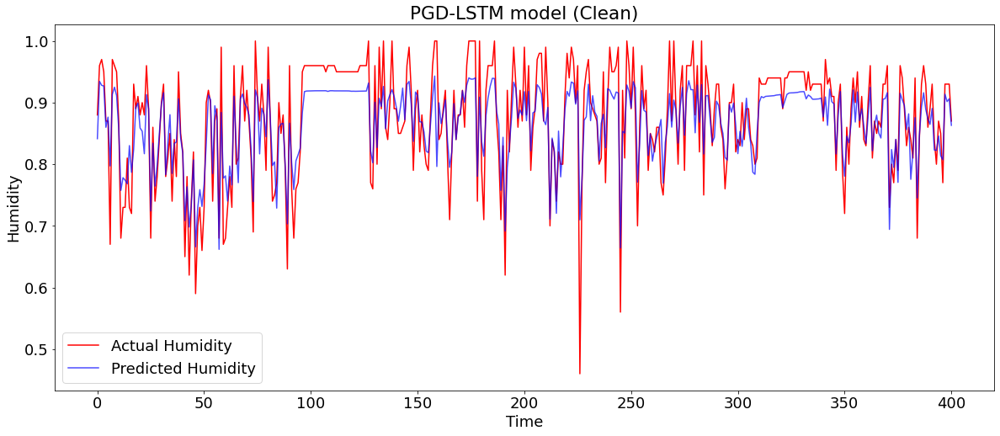

In [293]:
lstm_pgd_predictions=get_result(pgd_lstm, X_test, y_test, "PGD-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-LSTM model (Clean)", xLabel="Time" )

Model - PGS-LSTM:
R^2 Score: 0.10362693695345393
RMSE: 0.08466198271959893


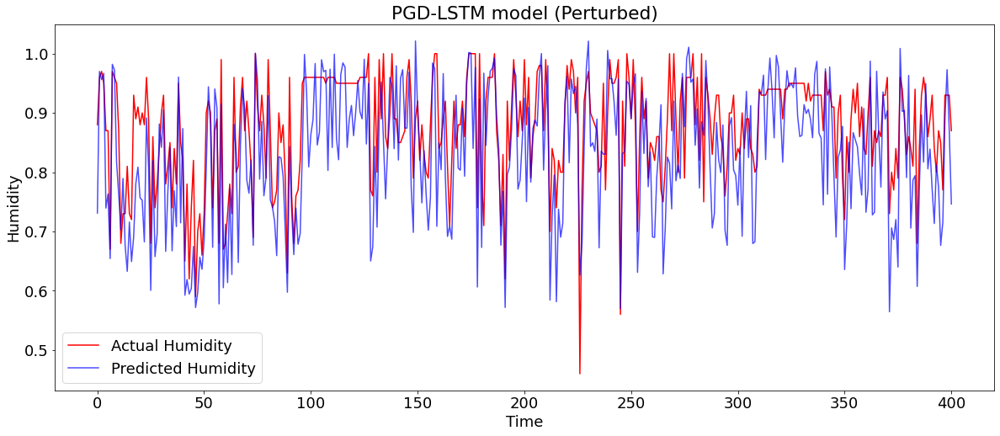

In [294]:
lstm_pgd_predictions=get_result(pgd_lstm, X_pgd_perturbed_lstm, y_test, "PGS-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-LSTM model (Perturbed)", xLabel="Time" )

#### Stacked LSTM

In [295]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_stlstm=stacked_lstm(X_new_fgsm,new_Y)

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_36 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_40 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_37 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_41 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_38 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_42 (Dropout)        (None, 10)                0         
                                                                 
 dense_34 (Dense)            (None, 1)               

Model - FGSM-StackedLSTM:
R^2 Score: 0.6808304050188047
RMSE: 0.05051899783537823


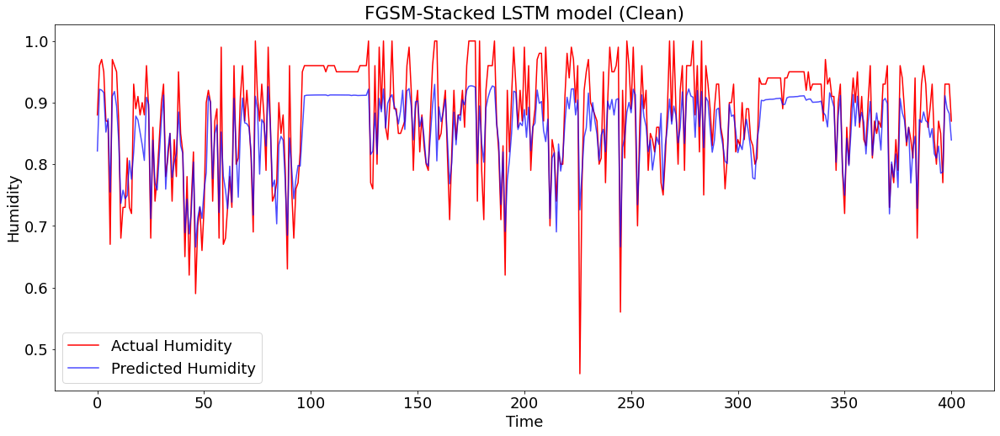

In [350]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_test, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-Stacked LSTM model (Clean)", xLabel="Time" )

Model - FGSM-StackedLSTM:
R^2 Score: 0.2896830291276131
RMSE: 0.07536507615846806


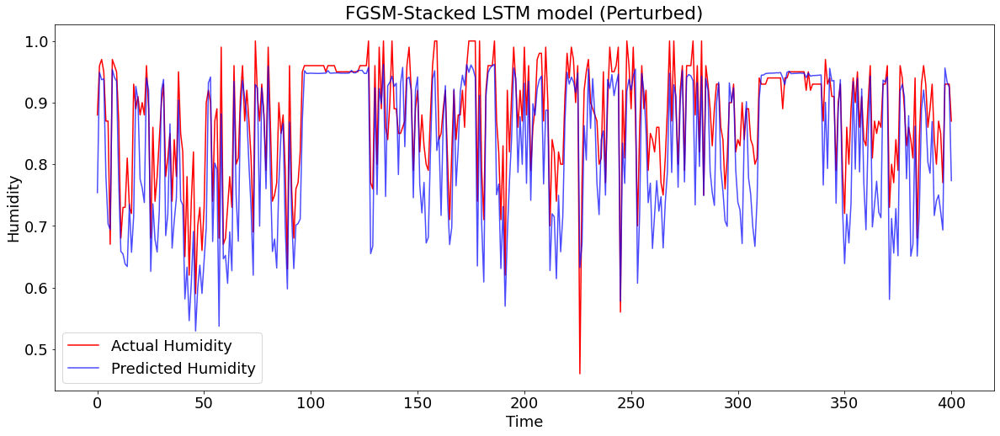

In [351]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_fgsm_perturbed_stlstm, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-Stacked LSTM model (Perturbed)", xLabel="Time" )

In [298]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_stlstm=stacked_lstm(X_new_bim,new_Y)

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_39 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_43 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_40 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_44 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_41 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_45 (Dropout)        (None, 10)                0         
                                                                 
 dense_35 (Dense)            (None, 1)               

Model - BIM-StackedLSTM:
R^2 Score: 0.6845682948060285
RMSE: 0.05022231017918689


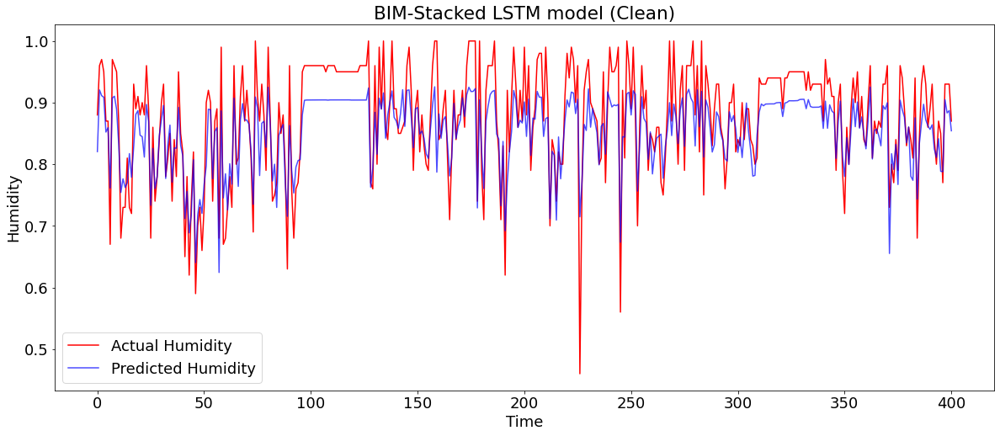

In [352]:

stlstm_bim_predictions=get_result(bim_stlstm, X_test, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-Stacked LSTM model (Clean)", xLabel="Time" )


Model - BIM-StackedLSTM:
R^2 Score: -0.13931138951119615
RMSE: 0.09544765180749949


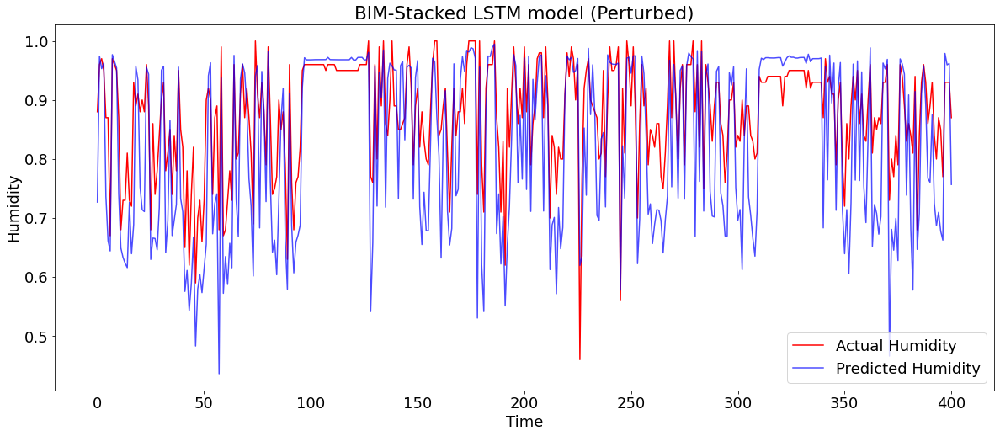

In [353]:

stlstm_bim_predictions=get_result(bim_stlstm, X_bim_perturbed_stlstm, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-Stacked LSTM model (Perturbed)", xLabel="Time" )


In [301]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_stlstm=stacked_lstm(X_new_pgd,new_Y)

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_42 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_46 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_43 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_47 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_44 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_48 (Dropout)        (None, 10)                0         
                                                                 
 dense_36 (Dense)            (None, 1)               

Model - PGD-StackedLSTM:
R^2 Score: 0.6729428964767282
RMSE: 0.0511394189416448


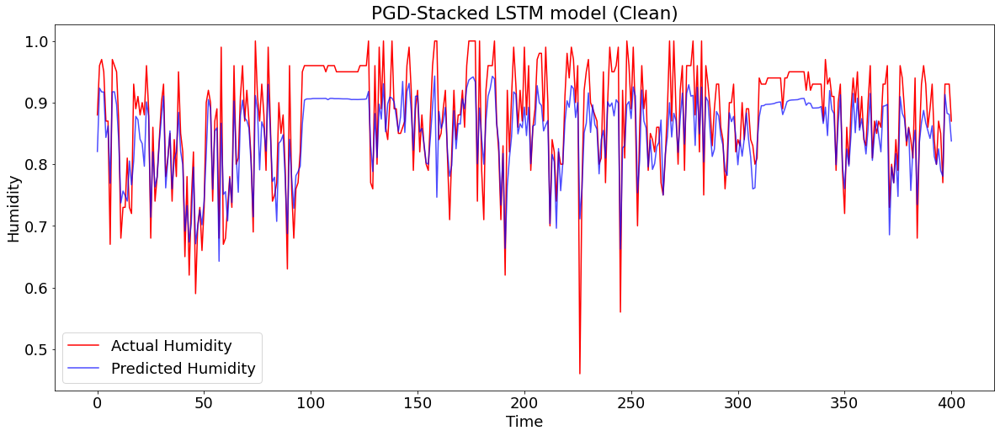

In [354]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_test, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-Stacked LSTM model (Clean)", xLabel="Time" )

Model - PGD-StackedLSTM:
R^2 Score: -0.43409301793864974
RMSE: 0.10708599030767586


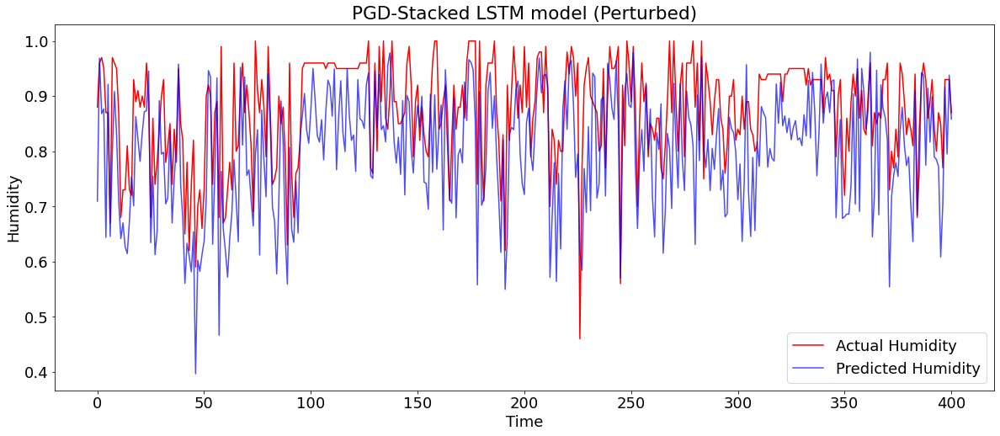

In [355]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_pgd_perturbed_stlstm, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-Stacked LSTM model (Perturbed)", xLabel="Time" )

#### GRU

In [304]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_gru=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_gru=gru(X_new_gru,new_Y)

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 50)                7950      
                                                                 
 dropout_49 (Dropout)        (None, 50)                0         
                                                                 
 dense_37 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 4s 10ms/step - loss: 0.0286
Epoch 2/40
204/204 [==============================] - 2s 10ms/step - loss: 0.0083
Epoch 3/40
204/204 [==============================] - 2s 12ms/step - loss: 0.0075
Epoch 4/40
204/204 [==============================] - 2s 10ms/step - 

Model - FGSM-GRU:
R^2 Score: 0.598498667595847
RMSE: 0.056661427311675915


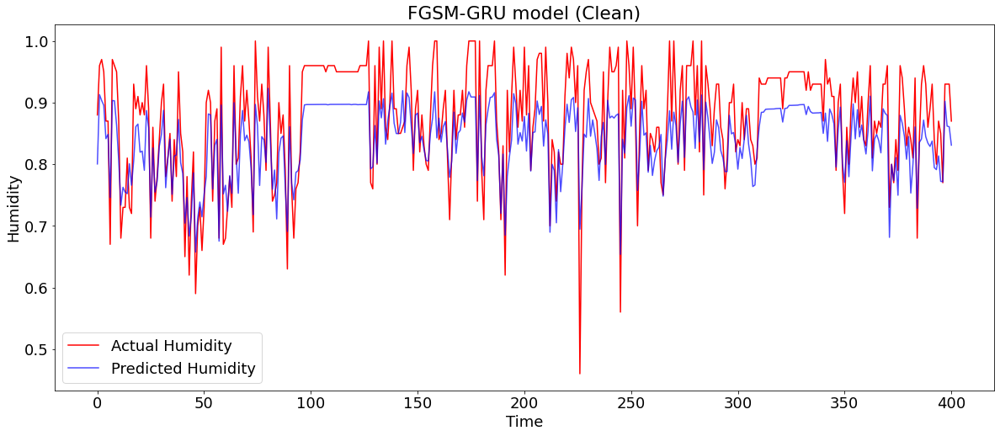

In [305]:
gru_fgsm_predictions=get_result(fgsm_gru, X_test, y_test, "FGSM-GRU")
plot_predictions(y_test, gru_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-GRU model (Clean)", xLabel="Time" )

Model - FGSM-StackedLSTM:
R^2 Score: -0.243217720444189
RMSE: 0.09970515919122575


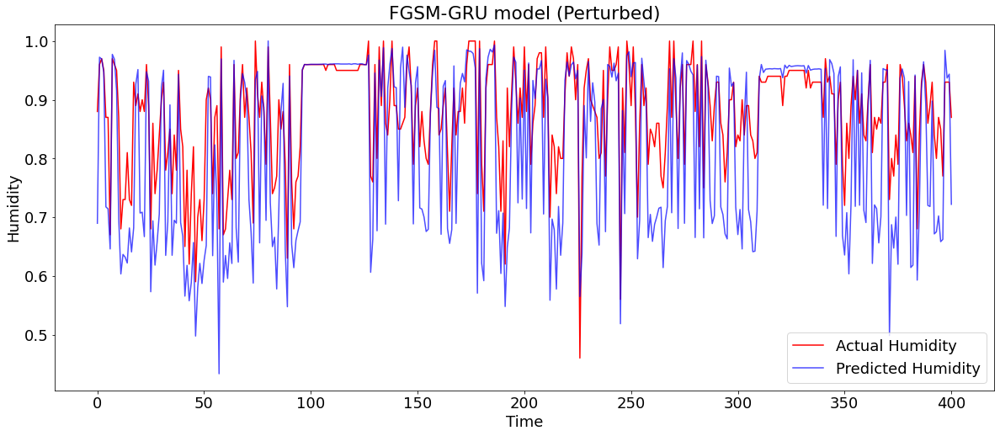

In [356]:
gru_fgsm_predictions=get_result(fgsm_gru, X_fgsm_perturbed_gru, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, gru_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-GRU model (Perturbed)", xLabel="Time" )


In [307]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_bim_perturbed_train))
bim_gru=gru(X_new_gru,new_Y)

Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 50)                7950      
                                                                 
 dropout_50 (Dropout)        (None, 50)                0         
                                                                 
 dense_38 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 4s 9ms/step - loss: 0.0392
Epoch 2/40
204/204 [==============================] - 2s 10ms/step - loss: 0.0088
Epoch 3/40
204/204 [==============================] - 2s 9ms/step - loss: 0.0076
Epoch 4/40
204/204 [==============================] - 2s 10ms/step - lo

Model - BIM-GRU:
R^2 Score: 0.810237139160934
RMSE: 0.03895377883982104


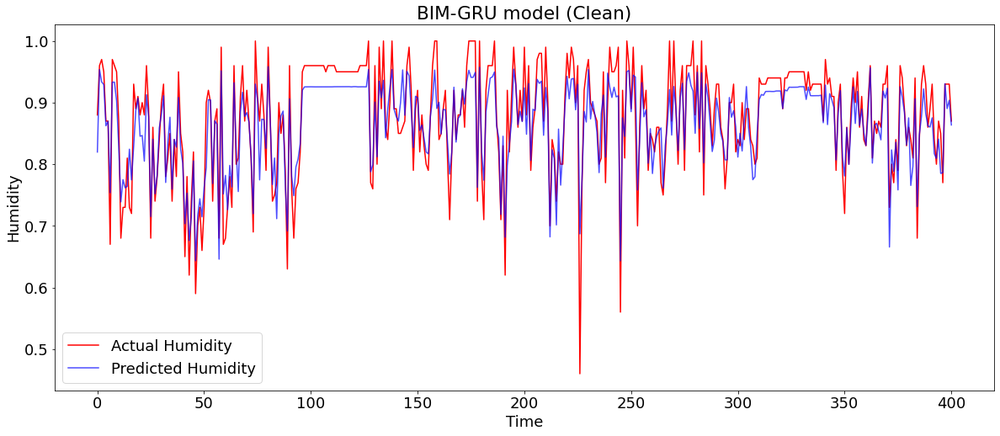

In [308]:
gru_bim_predictions=get_result(bim_gru, X_test, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-GRU model (Clean)", xLabel="Time" )

Model - BIM-GRU:
R^2 Score: -0.8580860058049153
RMSE: 0.12189248674826894


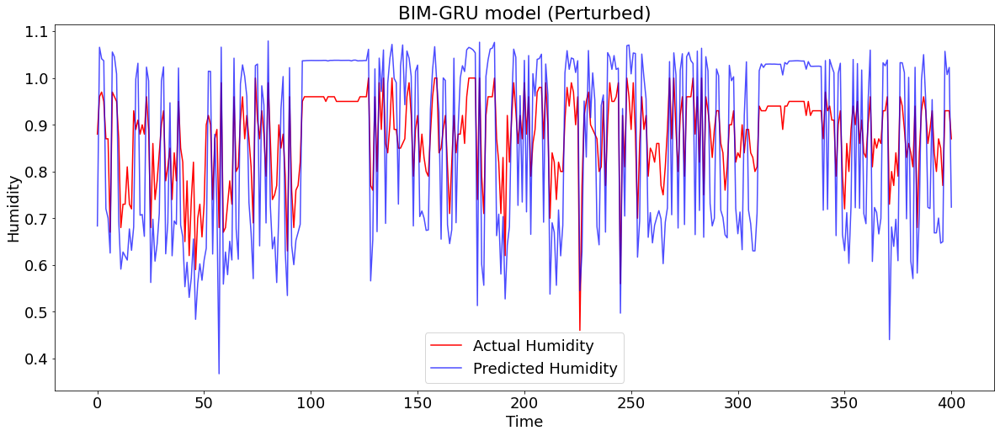

In [309]:
gru_bim_predictions=get_result(bim_gru, X_bim_perturbed_gru, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-GRU model (Perturbed)", xLabel="Time" )

In [310]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_gru=gru(X_new_gru,new_Y)

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_5 (GRU)                 (None, 50)                7950      
                                                                 
 dropout_51 (Dropout)        (None, 50)                0         
                                                                 
 dense_39 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 5s 12ms/step - loss: 0.0337
Epoch 2/40
204/204 [==============================] - 3s 13ms/step - loss: 0.0082
Epoch 3/40
204/204 [==============================] - 2s 12ms/step - loss: 0.0072
Epoch 4/40
204/204 [==============================] - 2s 11ms/step - 

Model - PGD-GRU:
R^2 Score: 0.8028995405489194
RMSE: 0.03969975659577464


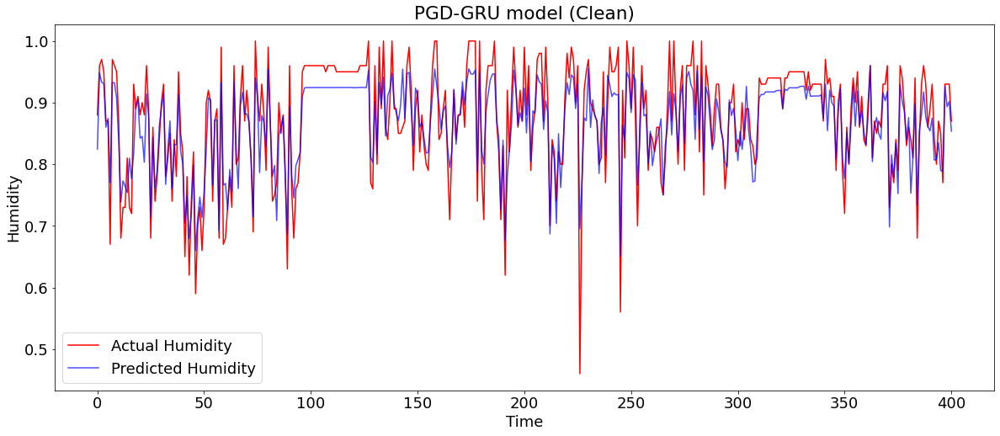

In [311]:
gru_pgd_predictions=get_result(pgd_gru, X_test, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-GRU model (Clean)", xLabel="Time" )

Model - PGD-GRU:
R^2 Score: -0.28912947586417337
RMSE: 0.10152950576224451


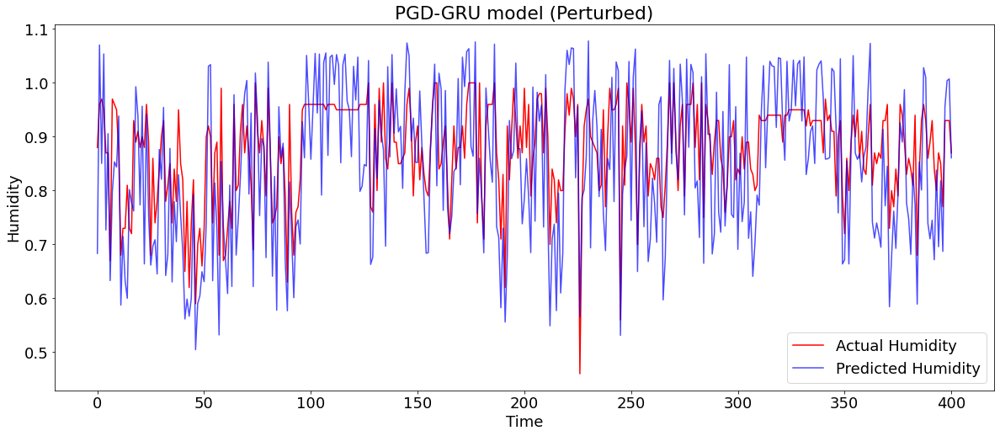

In [312]:
gru_pgd_predictions=get_result(pgd_gru, X_pgd_perturbed_gru, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-GRU model (Perturbed)", xLabel="Time" )

#### RNN

In [313]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_rnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_3 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_52 (Dropout)        (None, 50)                0         
                                                                 
 dense_40 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 2s 6ms/step - loss: 0.1227
Epoch 2/40
204/204 [==============================] - 1s 6ms/step - loss: 0.0203
Epoch 3/40
204/204 [==============================] - 1s 6ms/step - loss: 0.0132
Epoch 4/40
204/204 [==============================] - 1s 6ms/step - loss

Model - FGSM-RNN:
R^2 Score: 0.7250327516844444
RMSE: 0.04689045740613697


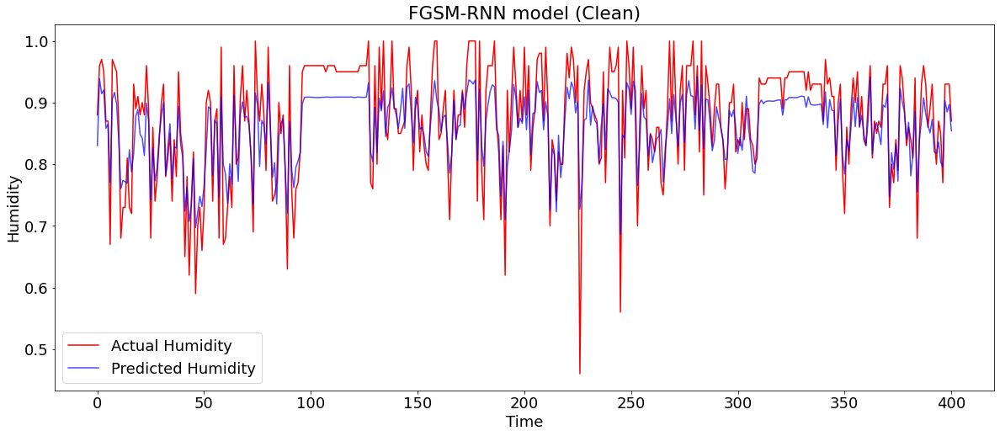

In [314]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_test, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-RNN model (Clean)", xLabel="Time" )

Model - FGSM-RNN:
R^2 Score: -0.07925226203107893
RMSE: 0.09289781865818565


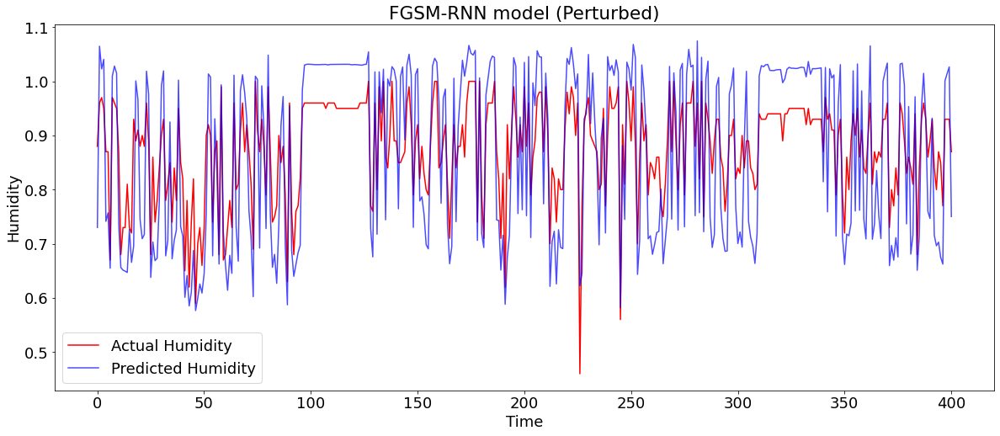

In [315]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_fgsm_perturbed_rnn, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-RNN model (Perturbed)", xLabel="Time" )

In [316]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_4 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_53 (Dropout)        (None, 50)                0         
                                                                 
 dense_41 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 2s 6ms/step - loss: 0.0208
Epoch 2/40
204/204 [==============================] - 2s 8ms/step - loss: 0.0080
Epoch 3/40
204/204 [==============================] - 1s 6ms/step - loss: 0.0071
Epoch 4/40
204/204 [==============================] - 1s 7ms/step - loss

Model - BIM-RNN:
R^2 Score: 0.7902819085562505
RMSE: 0.04095075933334408


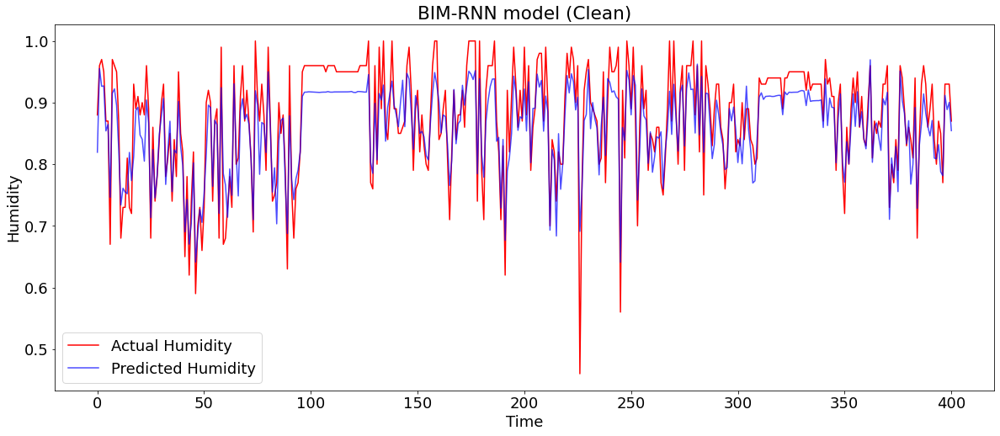

In [317]:
rnn_bim_predictions=get_result(bim_rnn, X_test, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-RNN model (Clean)", xLabel="Time" )

Model - BIM-RNN:
R^2 Score: -0.9968339995750892
RMSE: 0.1263615690984011


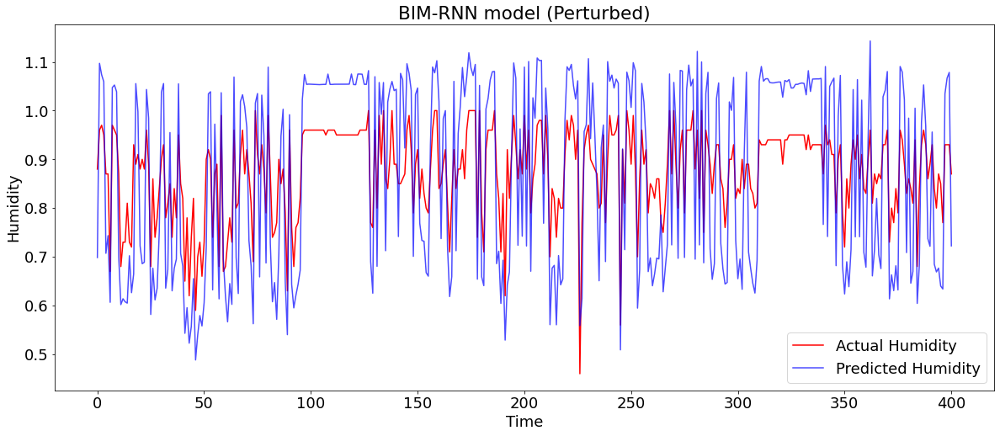

In [318]:
rnn_bim_predictions=get_result(bim_rnn, X_bim_perturbed_rnn, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-RNN model (Perturbed)", xLabel="Time" )

In [319]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_5 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_54 (Dropout)        (None, 50)                0         
                                                                 
 dense_42 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 2s 5ms/step - loss: 0.0234
Epoch 2/40
204/204 [==============================] - 1s 5ms/step - loss: 0.0092
Epoch 3/40
204/204 [==============================] - 1s 5ms/step - loss: 0.0081
Epoch 4/40
204/204 [==============================] - 1s 5ms/step - loss

Model - PGD-RNN:
R^2 Score: 0.7646774194385793
RMSE: 0.04337862528229485


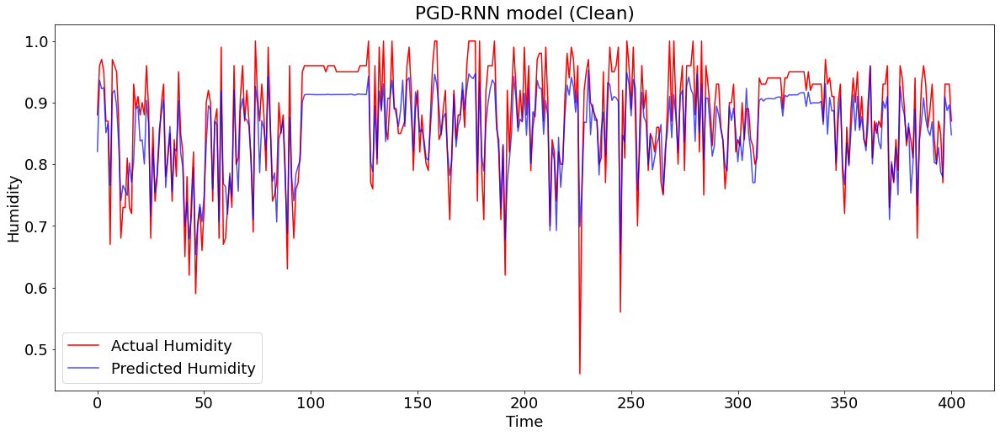

In [320]:
rnn_pgd_predictions=get_result(pgd_rnn, X_test, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-RNN model (Clean)", xLabel="Time" )

Model - PGD-RNN:
R^2 Score: -0.21283631447567442
RMSE: 0.09847933565204896


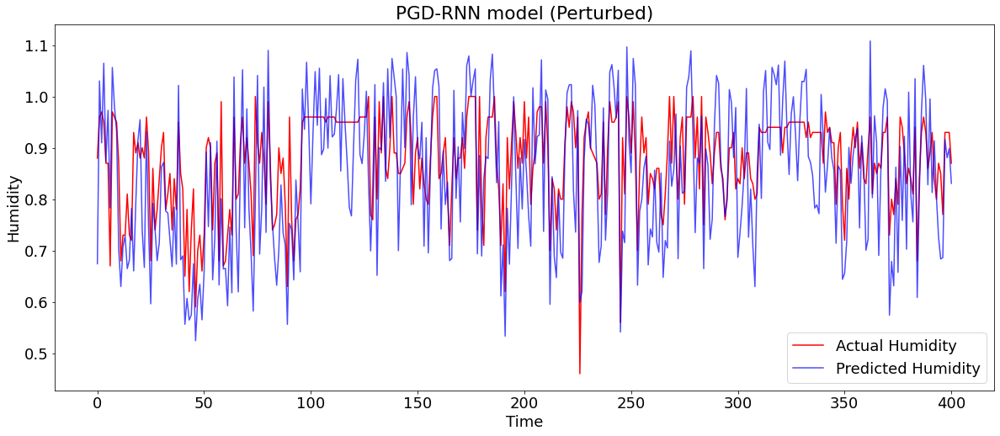

In [321]:
rnn_pgd_predictions=get_result(pgd_rnn, X_pgd_perturbed_rnn, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-RNN model (Perturbed)", xLabel="Time" )

#### CNN

In [322]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_cnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 704)               0         
                                                                 
 dense_43 (Dense)            (None, 10)                7050      
                                                                 
 dense_44 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - FGSM-CNN:
R^2 Score: 0.7268382854307113
RMSE: 0.04673625608887661


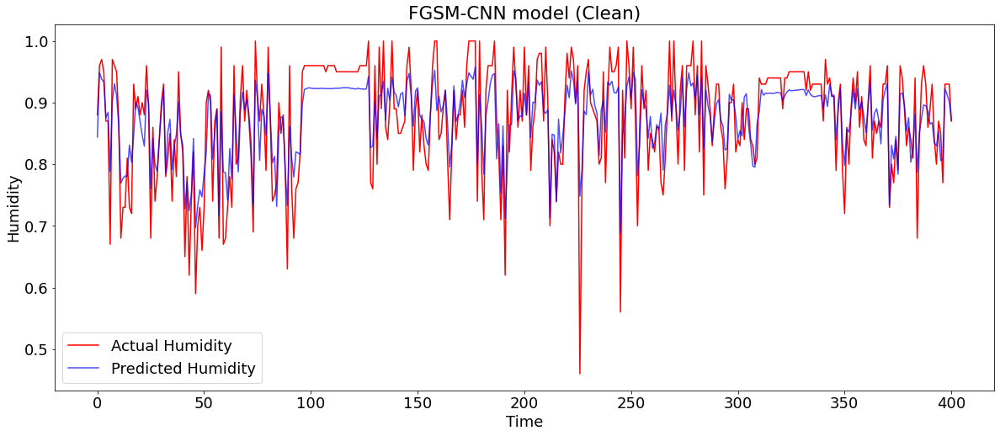

In [323]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_test, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN model (Clean)", xLabel="Time" )

Model - FGSM-CNN:
R^2 Score: 0.26259270996083395
RMSE: 0.07678877919290651


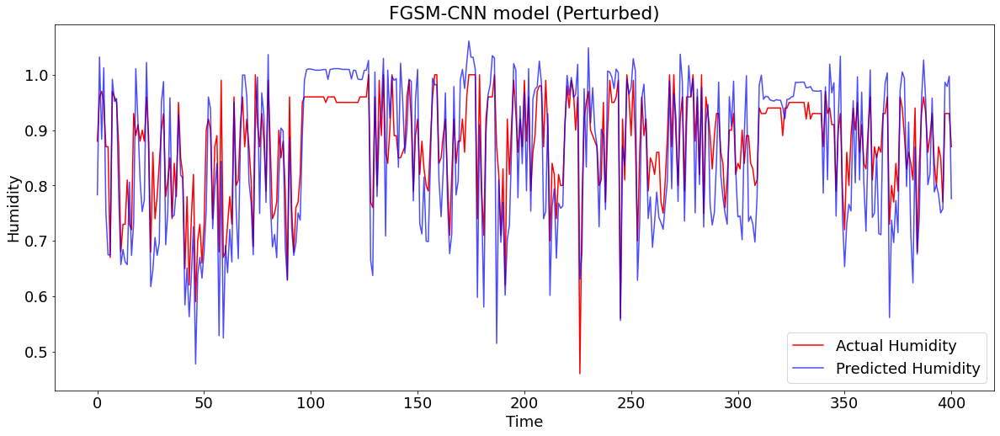

In [324]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_fgsm_perturbed_cnn, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN model (Perturbed)", xLabel="Time" )

In [325]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_5 (Flatten)         (None, 704)               0         
                                                                 
 dense_45 (Dense)            (None, 10)                7050      
                                                                 
 dense_46 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - BIM-CNN:
R^2 Score: 0.7617660772041323
RMSE: 0.04364613445121398


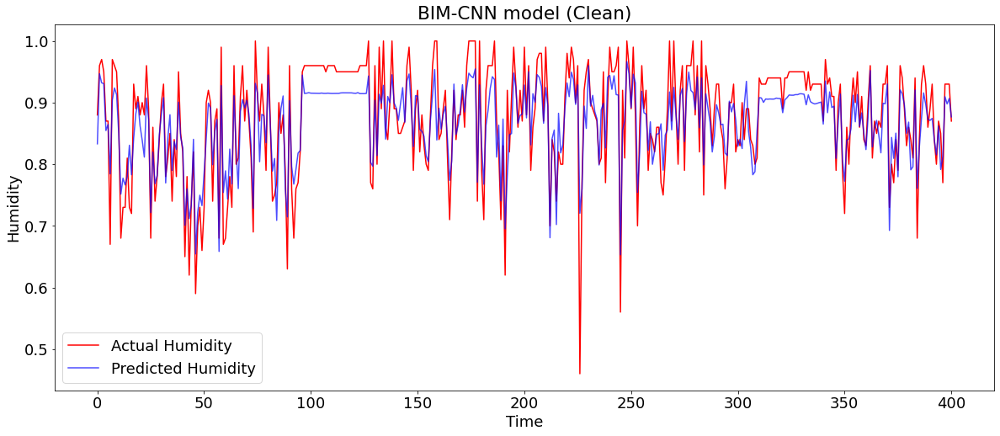

In [326]:
cnn_bim_predictions=get_result(bim_cnn, X_test, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN model (Clean)", xLabel="Time" )

Model - BIM-CNN:
R^2 Score: -0.4374238870610194
RMSE: 0.10721029338853057


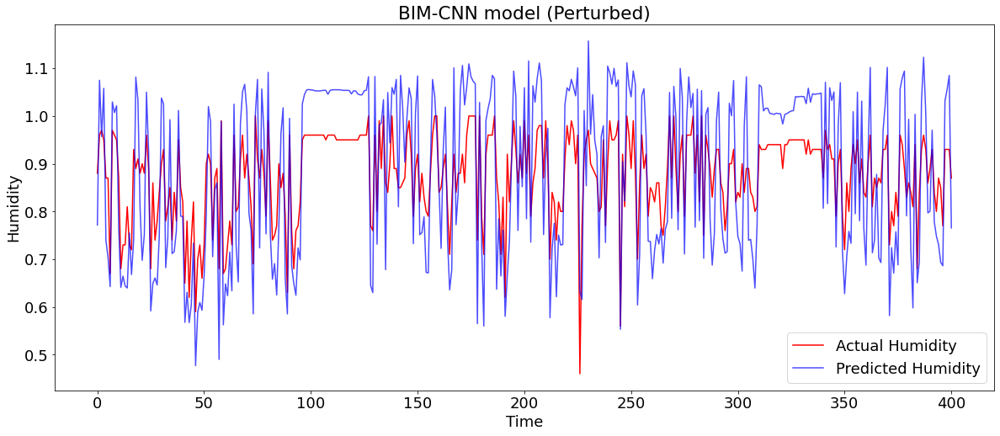

In [327]:
cnn_bim_predictions=get_result(bim_cnn, X_bim_perturbed_cnn, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN model (Perturbed)", xLabel="Time" )

In [328]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_6 (Flatten)         (None, 704)               0         
                                                                 
 dense_47 (Dense)            (None, 10)                7050      
                                                                 
 dense_48 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - PGD-CNN:
R^2 Score: 0.7848767848220153
RMSE: 0.04147511774069967


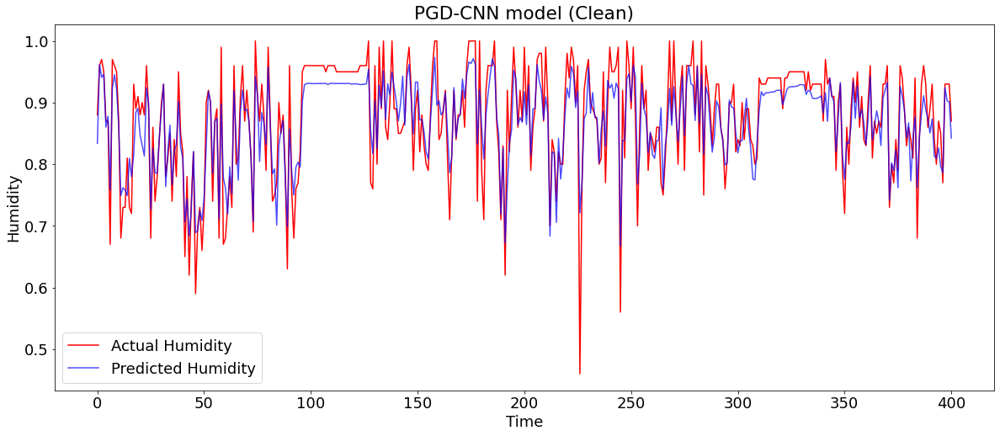

In [329]:
cnn_pgd_predictions=get_result(pgd_cnn, X_test, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN model (Clean)", xLabel="Time" )

Model - PGD-CNN:
R^2 Score: -0.014635341887907272
RMSE: 0.09007391265522001


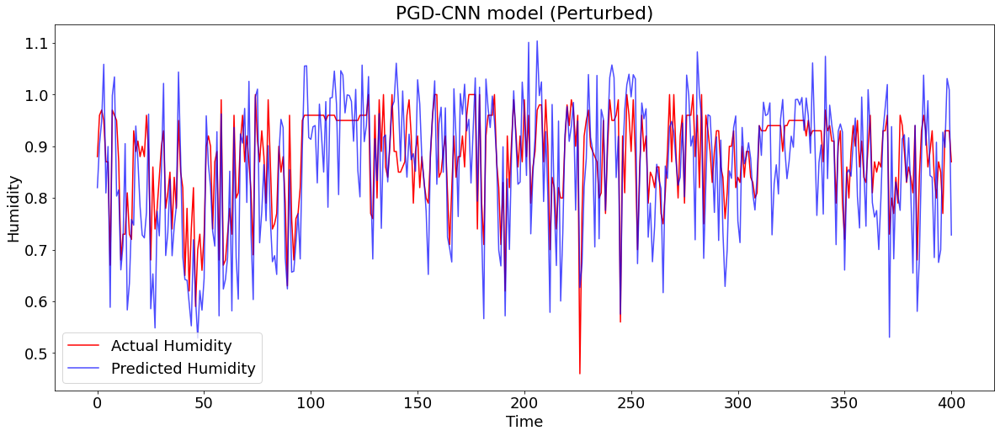

In [330]:
cnn_pgd_predictions=get_result(pgd_cnn, X_pgd_perturbed_cnn, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN model (Perturbed)", xLabel="Time" )

#### CNN_LSTM

In [331]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_cnnlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_45 (LSTM)              (None, 20)                58000     
                                                                 
 dense_49 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.5970826697980188
RMSE: 0.056761255553659705


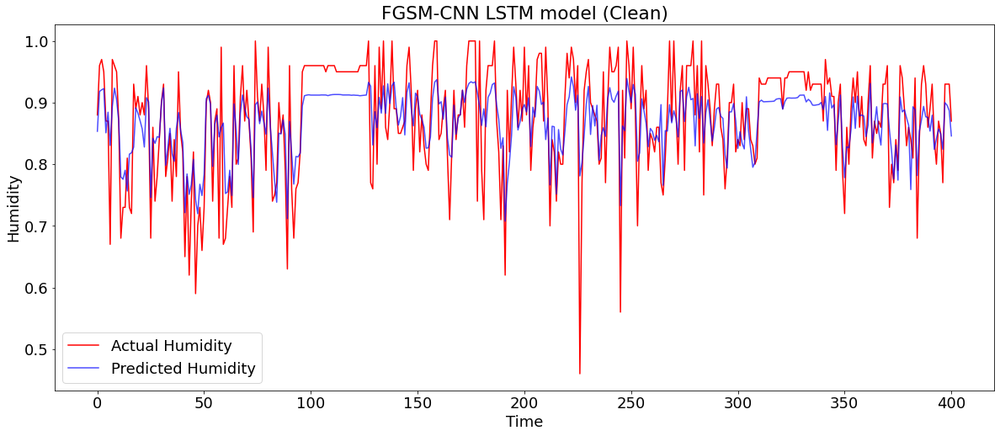

In [357]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: 0.15524406524466483
RMSE: 0.08218823182846278


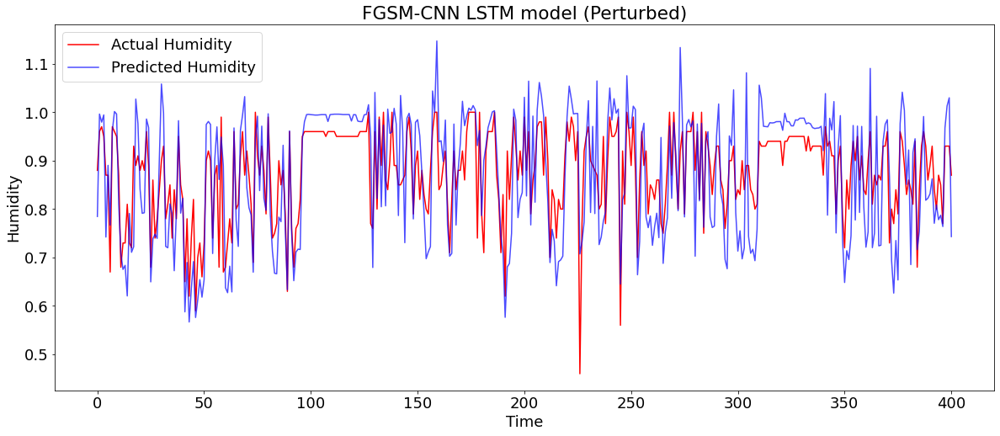

In [359]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN LSTM model (Perturbed)", xLabel="Time" )

In [334]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_6 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_8 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_46 (LSTM)              (None, 20)                58000     
                                                                 
 dense_50 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.6467059414531198
RMSE: 0.0531510913112869


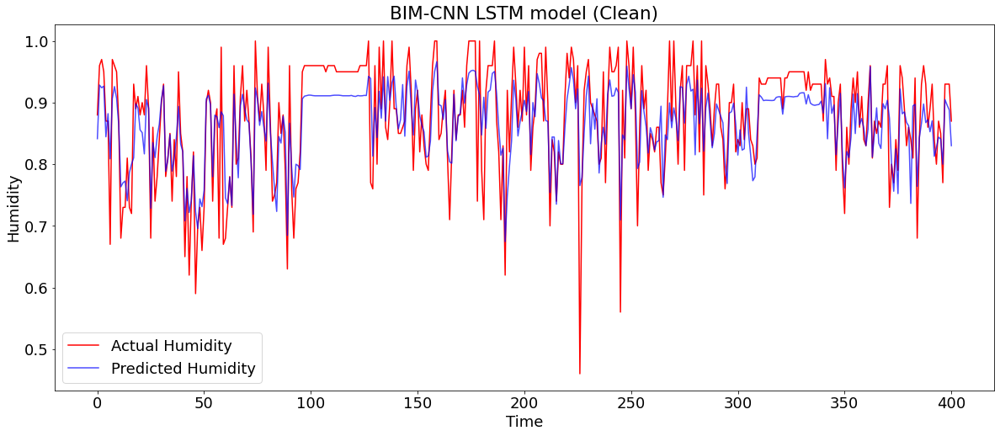

In [360]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: -0.8959320889620268
RMSE: 0.12312760051411206


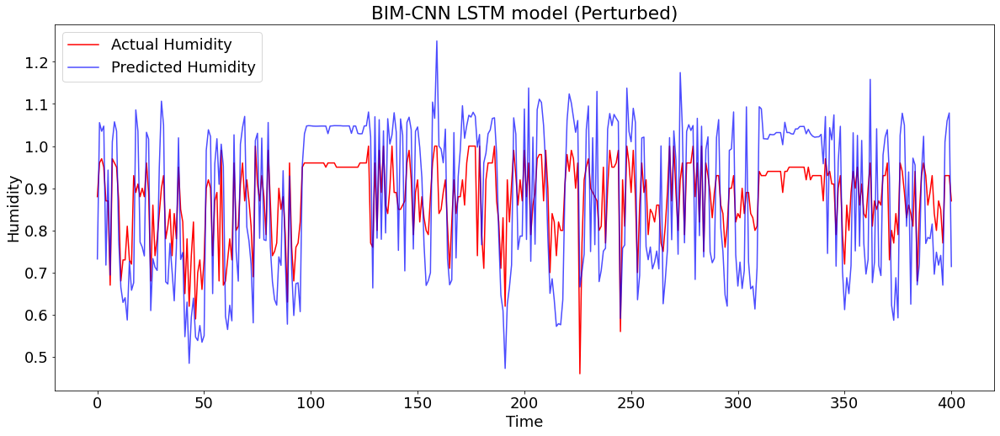

In [361]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN LSTM model (Perturbed)", xLabel="Time" )

In [337]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_9 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_10 (TimeDi  (None, None, 11, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, None, 704)        0         
 stributed)                                                      
                                                                 
 lstm_47 (LSTM)              (None, 20)                58000     
                                                                 
 dense_51 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.5612967299467118
RMSE: 0.0592283258332862


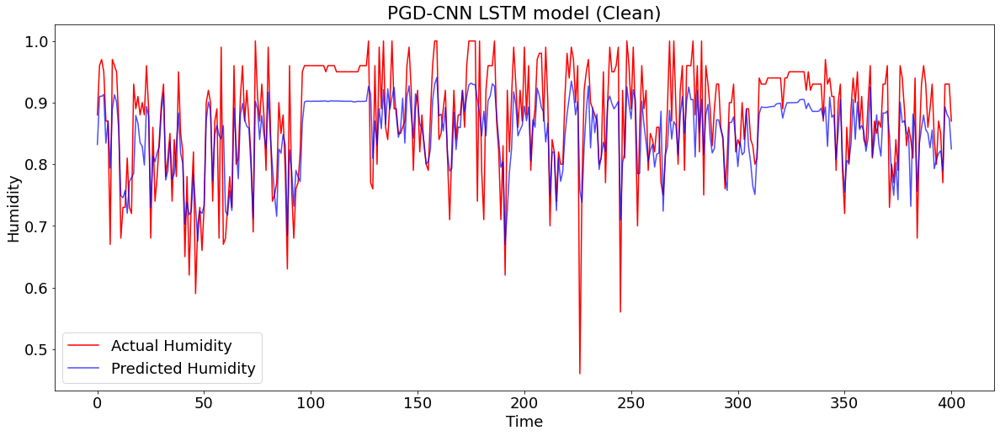

In [362]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: -0.09151957137334987
RMSE: 0.09342428588404139


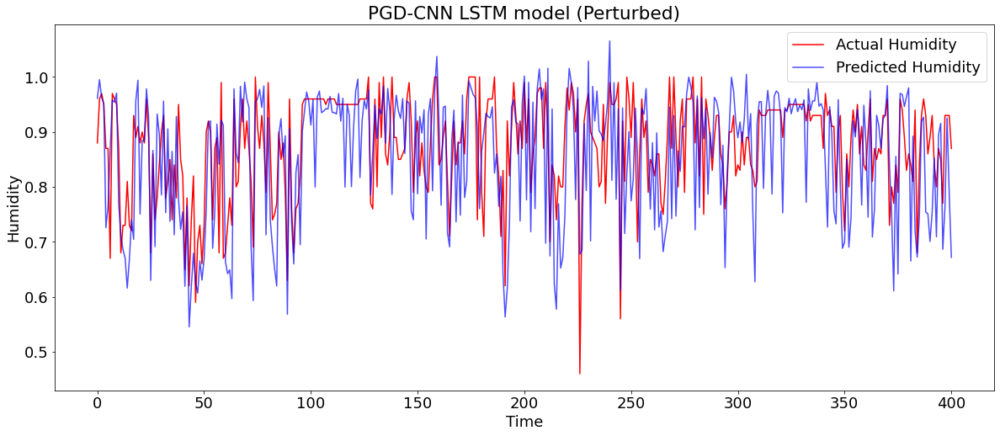

In [363]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN LSTM model (Perturbed)", xLabel="Time"  )

#### ConvLSTM

In [340]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_convlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_1 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_10 (Flatten)        (None, 1408)              0         
                                                                 
 dense_52 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 9s 18ms/step - loss: 0.0626
Epoch 2/40
204/204 [==============================] - 3s 13ms/step - loss: 0.0065
Epoch 3/40
204/204 [==============================] - 2s 8ms/step - loss: 0.0052
Epoch 4/40
204/204 [==============================] - 4s 17ms/step -

Model - ConvLSTM:
R^2 Score: 0.7111810218319063
RMSE: 0.04805702261258398


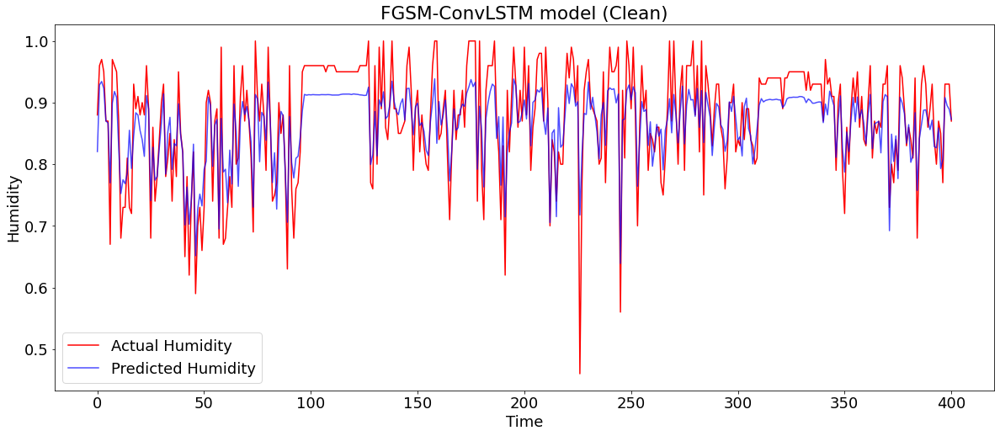

In [364]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: 0.10201366569408932
RMSE: 0.08473813505533358


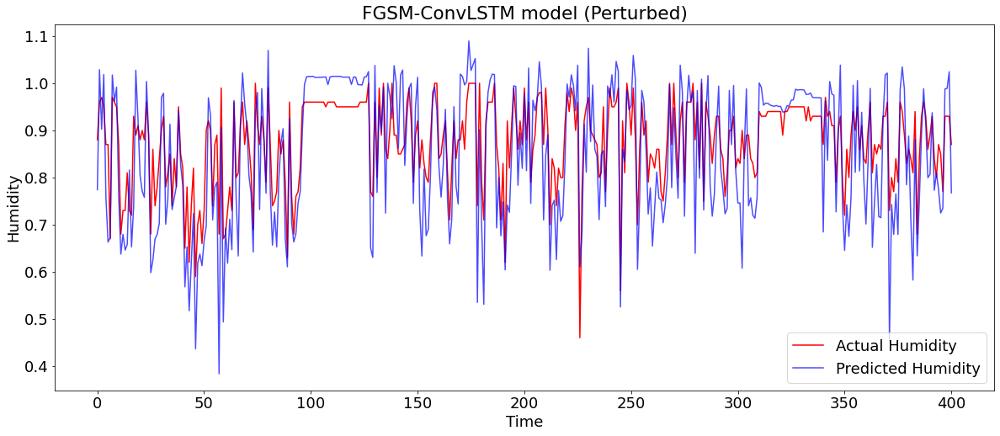

In [342]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-ConvLSTM model (Perturbed)", xLabel="Time" )

In [343]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_2 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_11 (Flatten)        (None, 1408)              0         
                                                                 
 dense_53 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 8s 11ms/step - loss: 0.0644
Epoch 2/40
204/204 [==============================] - 3s 14ms/step - loss: 0.0064
Epoch 3/40
204/204 [==============================] - 2s 11ms/step - loss: 0.0048
Epoch 4/40
204/204 [==============================] - 2s 10ms/step 

Model - ConvLSTM:
R^2 Score: 0.7529727177625072
RMSE: 0.04444433962655208


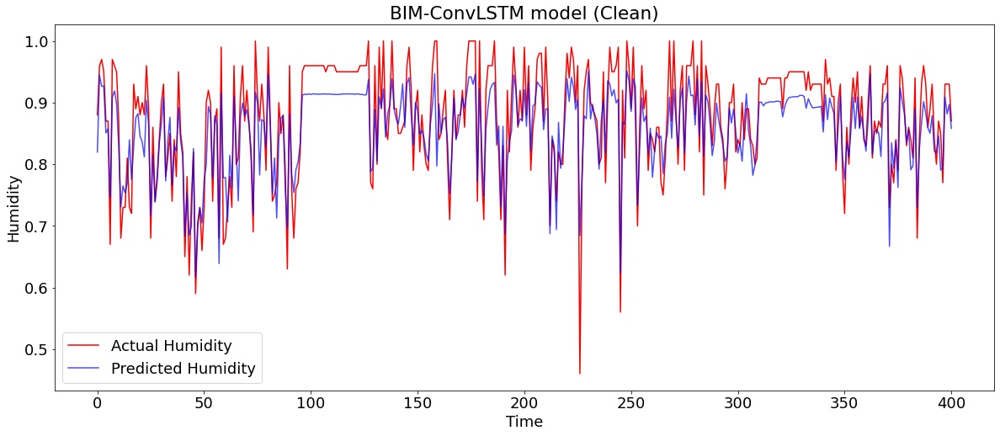

In [344]:
convlstm_bim_predictions=get_result(bim_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: -1.0054042333766207
RMSE: 0.12663244681099903


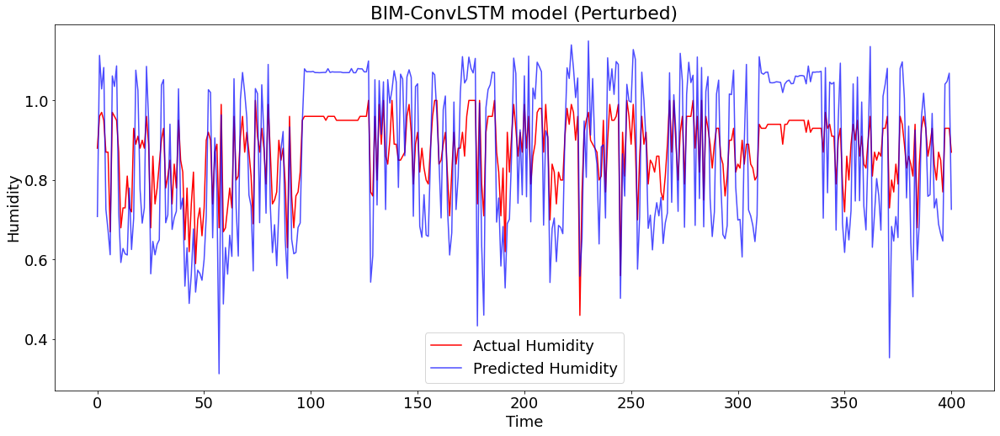

In [345]:
convlstm_bim_predictions=get_result(bim_convlstm, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-ConvLSTM model (Perturbed)", xLabel="Time" )

In [346]:
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_3 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_12 (Flatten)        (None, 1408)              0         
                                                                 
 dense_54 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
204/204 [==============================] - 5s 9ms/step - loss: 0.0553
Epoch 2/40
204/204 [==============================] - 2s 12ms/step - loss: 0.0067
Epoch 3/40
204/204 [==============================] - 2s 11ms/step - loss: 0.0050
Epoch 4/40
204/204 [==============================] - 2s 9ms/step - 

Model - ConvLSTM:
R^2 Score: 0.7435063343862571
RMSE: 0.04528791371027441


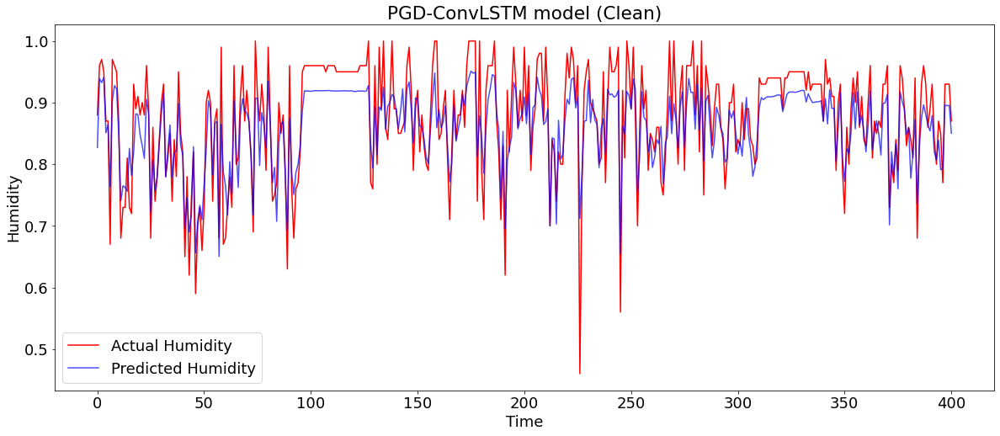

In [347]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: -0.038757393391292805
RMSE: 0.0911383341928566


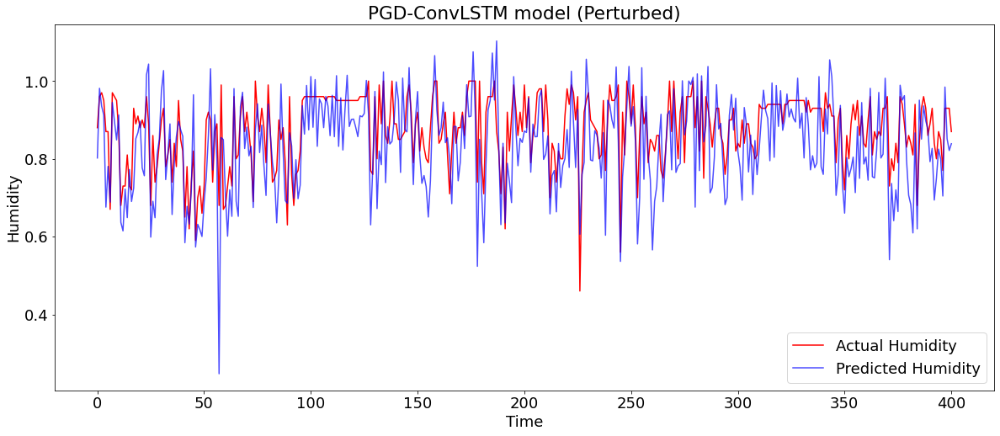

In [348]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-ConvLSTM model (Perturbed)", xLabel="Time" )